In [ ]:
import pandas as pd
import numpy as np

# Read the Excel file
df = pd.read_excel('Gas Data.xlsx', sheet_name='Gas Data', skiprows=1)

# Select only required columns (first column and columns after skipping 2,3,4,5)
df = df.iloc[:, [0] + list(range(5, 41))]  # Taking only up to 41 columns to match Jan 2022 to Dec 2024

# Create column names
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
years = ['2022', '2023', '2024']

new_columns = ['Meter_location']
for year in years:
    for month in months:
        new_columns.append(f'{month}_{year}')

# Verify column count matches
if len(df.columns) != len(new_columns):
    print(f"Warning: Column count mismatch. Data has {len(df.columns)} columns, names list has {len(new_columns)} columns")
    # Adjust data frame to match column count
    if len(df.columns) > len(new_columns):
        df = df.iloc[:, :len(new_columns)]
    else:
        for i in range(len(df.columns), len(new_columns)):
            df[f'Extra_{i}'] = np.nan

# Rename columns
df.columns = new_columns

# Clean Meter_location column - using forward fill instead of deprecated fillna method
df['Meter_location'] = df['Meter_location'].ffill()

# Convert numeric columns
for col in df.columns[1:]:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Remove unwanted rows
df = df[~df['Meter_location'].str.contains('Manually Read Meters|LTHW Consumption Values', na=False)]

# Fill NaN values with 0
df = df.fillna(0)

# Save processed data
df.to_csv('Gas_data_processed.csv', index=False)

# Display information
print("\nFirst few rows of processed data:")
print(df.head())
print("\nDataset Info:")
print(df.info())


In [28]:
import pandas as pd
import numpy as np

# Read the Excel file, skipping the first row
df = pd.read_excel('Gas Data.xlsx', sheet_name='Gas Data', skiprows=1)

# Select only required columns (first column and columns after skipping 2,3,4,5)
df = df.iloc[:, [0] + list(range(5, 41))]

# Create new column names
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
years = ['22', '23', '24']

new_columns = ['Meter_Location']
for year in years:
    for month in months:
        new_columns.append(f'{month}_{year}')

# Rename the columns
df.columns = new_columns

# Clean Meter_Location column
df['Meter_Location'] = df['Meter_Location'].ffill()

# Remove rows containing 'Manually Read Meters' or 'LTHW Consumption Values'
df = df[~df['Meter_Location'].str.contains('Manually Read Meters|LTHW Consumption Values', na=False)]

# Convert all columns except Meter_Location to numeric
for col in df.columns[1:]:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Fill NaN values with 0
df = df.fillna(0)

# Remove any rows where Meter_Location is empty or null
df = df[df['Meter_Location'].notna() & (df['Meter_Location'] != '')]

# Save the processed data
df.to_csv('Gas_data_cleaned.csv', index=False)

# Display information about the processed data
print("\nFirst few rows of processed data:")
print(df.head())
print("\nDataset Info:")
print(df.info())



First few rows of processed data:
                                      Meter_Location  Jan_22        Feb_22  \
0                G60X,UNIVERSITY COLLEGE 1,315 LEITH     0.0      0.000000   
1             K308 CFC 911 CUMBERLAND STREET,DUNEDIN     0.0      0.000000   
2  K427,CFC EAST ABBEY COLLEGE,682 CASTLE STREET,...     0.0   3304.524701   
3              D206, MEDICAL SCHOOL (HERCUS) HANOVER     0.0      0.000000   
4          G404,CAMPUS (MICROBIOLOGY),720 CUMBERLAND     0.0  13860.560498   

         Mar_22        Apr_22        May_22        Jun_22        Jul_22  \
0      0.000000      0.000000      0.000000      0.000000      0.000000   
1      0.000000      0.000000      0.000000      0.000000      0.000000   
2   3304.524701   8138.008593  15338.913166  20320.360850  20714.930964   
3      0.000000      0.000000      0.000000      0.000000      0.000000   
4  13860.560498  18351.099231  17714.644923  18315.740659  18740.043531   

         Aug_22        Sep_22  ...   Mar_24  

In [62]:
import pandas as pd
import numpy as np

# Read the Excel file
df = pd.read_excel('Gas Data.xlsx', sheet_name='Gas Data', skiprows=0)

# Initialize empty DataFrames for Automated Meters and LTHW
automated_section = df[df.index < df[df.iloc[:,0].str.contains('Manually Read Meters', na=False)].index[0]]
lthw_section = df[df.index > df[df.iloc[:,0].str.contains('LTHW Consumption Values', na=False)].index[0]]

# Select required columns (first column and columns G to AP)
cols_to_use = [0] + list(range(6, 42))  # Column A and columns G to AP

# Process each section
automated_df = automated_section.iloc[:, cols_to_use].copy()
lthw_df = lthw_section.iloc[:, cols_to_use].copy()

# Create column names
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
years = ['2022', '2023', '2024']

new_columns = ['Meter_location']
for year in years:
    for month in months:
        new_columns.append(f'{month}_{year}')

# Rename columns
automated_df.columns = new_columns
lthw_df.columns = new_columns

# Clean data
automated_df = automated_df[~automated_df['Meter_location'].str.contains('Manually Read Meters|LTHW Consumption Values', na=False)]
lthw_df = lthw_df[~lthw_df['Meter_location'].str.contains('Manually Read Meters|LTHW Consumption Values', na=False)]

# Forward fill meter locations and remove empty rows
automated_df['Meter_location'] = automated_df['Meter_location'].ffill()
lthw_df['Meter_location'] = lthw_df['Meter_location'].ffill()
automated_df = automated_df.dropna(subset=['Meter_location'])
lthw_df = lthw_df.dropna(subset=['Meter_location'])

# Combine datasets
combined_df = pd.concat([automated_df, lthw_df], ignore_index=True)

# Convert to numeric and handle negative values
for col in combined_df.columns[1:]:
    combined_df[col] = pd.to_numeric(combined_df[col], errors='coerce')
    combined_df[col] = combined_df[col].where(combined_df[col] >= 0, np.nan)

def seasonal_imputation(df):
    df_imputed = df.copy()
    
    # For each meter location
    for meter in df_imputed['Meter_location'].unique():
        meter_data = df_imputed[df_imputed['Meter_location'] == meter]
        
        # For each month (Jan-Dec)
        for month in ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                     'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']:
            # Get all columns for this month
            month_cols = [col for col in df_imputed.columns if col.startswith(month + '_')]
            
            # For each meter location
            mask = (df_imputed['Meter_location'] == meter)
            
            # Get values for this month across all years
            month_values = meter_data[month_cols].values
            valid_values = month_values[np.where((~np.isnan(month_values)) & (month_values > 0))]
            
            if len(valid_values) > 0:
                # Calculate mean of valid values
                month_mean = np.mean(valid_values)
                
                # Fill missing, null, negative or zero values
                for col in month_cols:
                    null_mask = mask & (df_imputed[col].isna() | (df_imputed[col] <= 0))
                    df_imputed.loc[null_mask, col] = month_mean
            else:
                # If no valid values exist, fill with 0
                for col in month_cols:
                    null_mask = mask & (df_imputed[col].isna() | (df_imputed[col] <= 0))
                    df_imputed.loc[null_mask, col] = 0
    
    # Fill any remaining NaN values with 0
    df_imputed = df_imputed.fillna(0)
    
    return df_imputed


# Apply imputation
df_imputed = seasonal_imputation(combined_df)

# Round all numeric values to 2 decimal places
numeric_cols = df_imputed.columns[1:]
df_imputed[numeric_cols] = df_imputed[numeric_cols].round(2)

# Save to CSV
df_imputed.to_csv('cleaned_gas_data.csv', index=False)

# Print information about the processed data
print("\nFirst few rows of processed data:")
print(df_imputed.head())
print("\nDataset Info:")
print(df_imputed.info())



First few rows of processed data:
                                      Meter_location  Jan_2022  Feb_2022  \
0         F512,INFORMATION TECHNOLOGY BLDG,270 LEITH   6594.87   6594.87   
1                G60X,UNIVERSITY COLLEGE 1,315 LEITH  27880.98   2716.78   
2             K308 CFC 911 CUMBERLAND STREET,DUNEDIN   2707.39   3290.98   
3  K427,CFC EAST ABBEY COLLEGE,682 CASTLE STREET,...   3304.52   3304.52   
4              D206, MEDICAL SCHOOL (HERCUS) HANOVER      0.00      0.00   

   Mar_2022  Apr_2022  May_2022  Jun_2022  Jul_2022  Aug_2022  Sep_2022  ...  \
0   5208.26   7744.75  13697.05  17045.22  27969.03  25973.66  23707.73  ...   
1    100.00      0.00      0.00   2834.57   8673.50  17638.00  41296.00  ...   
2   5971.56   7342.91   8137.18   8142.46  11581.47   6869.85   7994.56  ...   
3   8138.01  15338.91  20320.36  20714.93  25647.06  17114.48  20000.00  ...   
4      0.00      0.00      0.00      0.00      0.00  17871.00  18416.00  ...   

   Mar_2024  Apr_2024  May_

In [72]:
import pandas as pd

# Read the cleaned gas data
df = pd.read_csv('cleaned_gas_data.csv')

# Create Automated Meters DataFrame (first 28 rows)
autometers_reading = df.iloc[:28, :]

# Create LTHW Consumption DataFrame (starting from row 29)
lthw_consumption = df.iloc[28:, :]

# Reset indices for both DataFrames
autometers_reading.reset_index(drop=True, inplace=True)
lthw_consumption.reset_index(drop=True, inplace=True)

# Save the separated data to CSV files
autometers_reading.to_csv('automated_meters.csv', index=False)
lthw_consumption.to_csv('lthw_consumption.csv', index=False)

# Display basic information about both DataFrames
print("Automated Meters DataFrame Shape:", autometers_reading.shape)
print("\nLTHW Consumption DataFrame Shape:", lthw_consumption.shape)


Automated Meters DataFrame Shape: (28, 37)

LTHW Consumption DataFrame Shape: (15, 37)


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load data
df = pd.read_csv('automated_meters.csv')

# Convert columns to datetime for time series analysis
months = pd.date_range(start='2022-01-01', end='2024-12-01', freq='ME')
df_melted = pd.melt(df, id_vars=['Meter_location'], var_name='Month', value_name='Consumption')


In [5]:
# Calculate basic statistics for each meter
def analyze_consumption_patterns():
    stats_df = df.set_index('Meter_location').select_dtypes(include=[np.number]).agg([
        'mean', 'std', 'min', 'max'
    ]).round(2)
    
    # Calculate coefficient of variation
    stats_df['cv'] = (stats_df['std'] / stats_df['mean'] * 100).round(2)
    return stats_df

# Identify high consumption locations
def top_consumers():
    yearly_avg = df.set_index('Meter_location').mean(axis=1).sort_values(ascending=False)
    return yearly_avg.head(5)


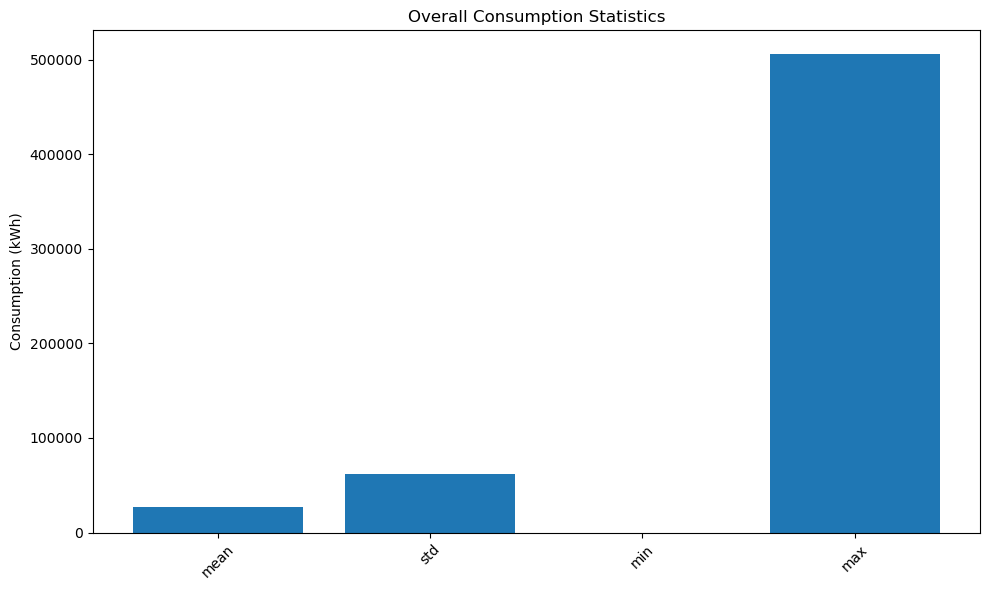

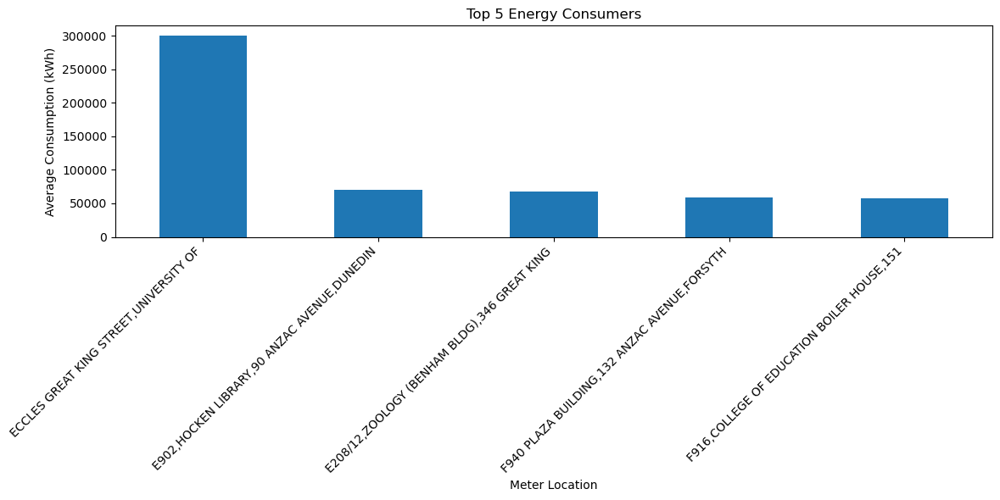


Top 5 Consumers Average Consumption (kWh):


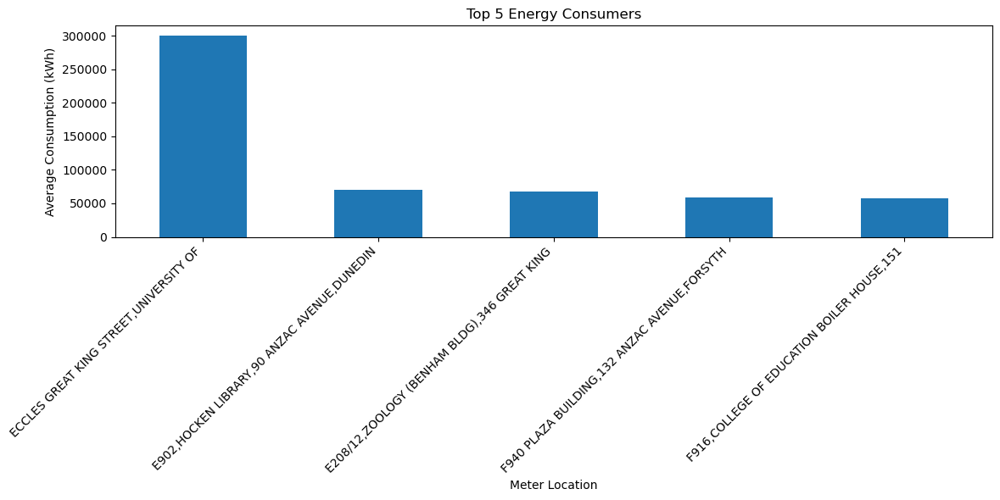

Meter_location
ECCLES GREAT KING STREET,UNIVERSITY OF          300074.440833
E902,HOCKEN LIBRARY,90 ANZAC AVENUE,DUNEDIN      69648.981667
E208/12,ZOOLOGY (BENHAM BLDG),346 GREAT KING     68179.239167
F940 PLAZA BUILDING,132 ANZAC AVENUE,FORSYTH     58652.351944
F916,COLLEGE OF EDUCATION BOILER HOUSE,151       58143.677778
dtype: float64


In [9]:

# Read the data
df = pd.read_csv('automated_meters.csv')

# Calculate basic statistics
def analyze_consumption_patterns():
    # Remove 'Meter_location' column for calculations
    numeric_df = df.select_dtypes(include=[np.number])
    
    # Calculate statistics
    stats = {
        'mean': numeric_df.mean().mean(),
        'std': numeric_df.std().mean(),
        'min': numeric_df.min().min(),
        'max': numeric_df.max().max()
    }
    
    # Create bar plot for statistics
    plt.figure(figsize=(10, 6))
    plt.bar(stats.keys(), stats.values())
    plt.title('Overall Consumption Statistics')
    plt.ylabel('Consumption (kWh)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Identify and plot top consumers
def plot_top_consumers():
    # Calculate average consumption for each meter
    avg_consumption = df.iloc[:, 1:].mean(axis=1)
    avg_consumption.index = df['Meter_location']
    top_5 = avg_consumption.nlargest(5)
    
    # Create bar plot
    plt.figure(figsize=(12, 6))
    top_5.plot(kind='bar')
    plt.title('Top 5 Energy Consumers')
    plt.xlabel('Meter Location')
    plt.ylabel('Average Consumption (kWh)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    return top_5

# Execute both visualizations
analyze_consumption_patterns()
plot_top_consumers()

# Print top 5 consumers with their average consumption
print("\nTop 5 Consumers Average Consumption (kWh):")
print(plot_top_consumers())

In [11]:
def plot_seasonal_patterns():
    plt.figure(figsize=(15, 6))
    
    # Group by month across years
    monthly_avg = df_melted.groupby([df_melted['Month'].str[:3]])['Consumption'].mean()
    
    plt.plot(range(12), monthly_avg.values, marker='o')
    plt.title('Average Monthly Consumption Pattern')
    plt.xlabel('Month')
    plt.ylabel('Average Consumption')
    plt.xticks(range(12), monthly_avg.index)
    plt.grid(True)
    plt.show()


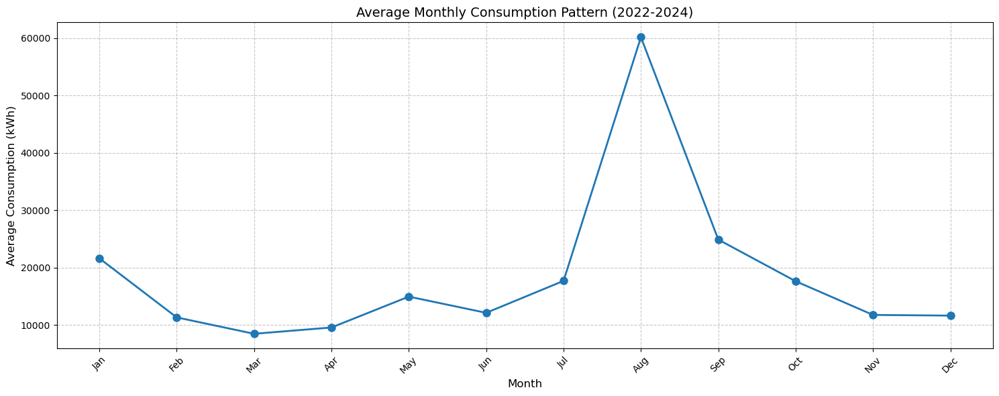

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'imputed_modelling_gas_data.csv'
df = pd.read_csv(file_path)

# Melt the dataframe to convert months to rows
df_melted = pd.melt(df, 
                    id_vars=['Meter_Location'],  # Adjust column name as per dataset
                    var_name='Month',
                    value_name='Consumption')

# Extract month abbreviation from the Month column
df_melted['Month'] = df_melted['Month'].str[:3]

# Calculate monthly averages
monthly_avg = df_melted.groupby('Month')['Consumption'].mean()

# Ensure months are in correct order
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_avg = monthly_avg.reindex(month_order)

# Create the plot
plt.figure(figsize=(15, 6))
plt.plot(range(12), monthly_avg.values, marker='o', linewidth=2, markersize=8)
plt.title('Average Monthly Consumption Pattern (2022-2024)', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Consumption (kWh)', fontsize=12)
plt.xticks(range(12), month_order, rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [27]:
# Read the data
df = pd.read_csv('automated_meter.csv')

# Melt the dataframe to convert months to rows
df_melted = pd.melt(df, 
                    id_vars=['Meter_location'],
                    var_name='Month',
                    value_name='Consumption')

# Extract month abbreviation from the Month column
df_melted['Month'] = df_melted['Month'].str[:3]

# Calculate monthly averages
monthly_avg = df_melted.groupby('Month')['Consumption'].mean()

# Ensure months are in correct order
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_avg = monthly_avg.reindex(month_order)

# Create the plot
plt.figure(figsize=(15, 6))
plt.plot(range(12), monthly_avg.values, marker='o', linewidth=2, markersize=8)
plt.title('Average Monthly Consumption Pattern (2022-2024)', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Consumption (kWh)', fontsize=12)
plt.xticks(range(12), month_order, rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'automated_meter.csv'

In [89]:
def yearly_comparison():
    # Split data by year
    yearly_consumption = {
        '2022': df.filter(like='2022').sum(),
        '2023': df.filter(like='2023').sum(),
        '2024': df.filter(like='2024').sum()
    }
    
    return pd.DataFrame(yearly_consumption).T


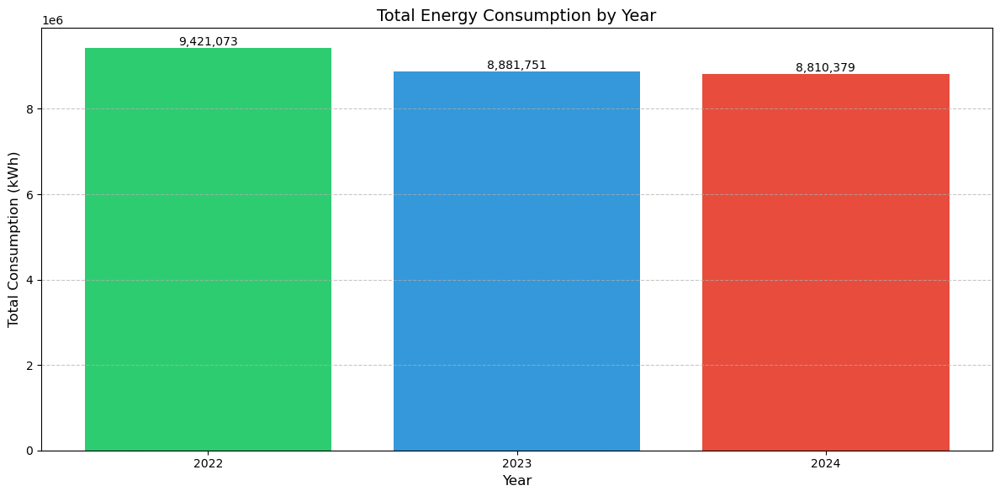

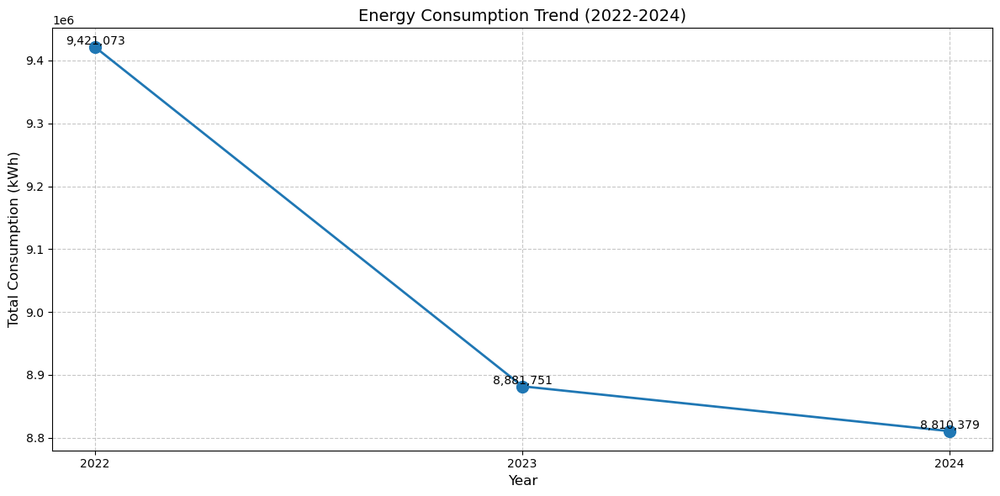

In [29]:
# Read the data
df = pd.read_csv('automated_meters.csv')

# Calculate yearly consumption
yearly_consumption = {
    '2022': df.filter(like='2022').sum().sum(),
    '2023': df.filter(like='2023').sum().sum(),
    '2024': df.filter(like='2024').sum().sum()
}

# Convert to DataFrame
yearly_df = pd.DataFrame(yearly_consumption.items(), columns=['Year', 'Consumption'])

# Create bar plot
plt.figure(figsize=(12, 6))
plt.bar(yearly_df['Year'], yearly_df['Consumption'], 
        color=['#2ecc71', '#3498db', '#e74c3c'])
plt.title('Total Energy Consumption by Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Consumption (kWh)', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(yearly_df['Consumption']):
    plt.text(i, v, f'{v:,.0f}', ha='center', va='bottom')

plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Create line plot for trend
plt.figure(figsize=(12, 6))
plt.plot(yearly_df['Year'], yearly_df['Consumption'],
         marker='o', linewidth=2, markersize=10)
plt.title('Energy Consumption Trend (2022-2024)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Consumption (kWh)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Add value labels
for i, v in enumerate(yearly_df['Consumption']):
    plt.text(i, v, f'{v:,.0f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


In [7]:

# Read the data
df = pd.read_csv('imputed_modelling_gas_data.csv')

# Calculate yearly consumption
yearly_consumption = {
    '2022': df.filter(like='2022').sum().sum(),
    '2023': df.filter(like='2023').sum().sum(),
    '2024': df.filter(like='2024').sum().sum()
}

# Convert to DataFrame
yearly_df = pd.DataFrame(yearly_consumption.items(), columns=['Year', 'Consumption'])

# Create bar plot
plt.figure(figsize=(12, 6))
plt.bar(yearly_df['Year'], yearly_df['Consumption'], 
        color=['#2ecc71', '#3498db', '#e74c3c'])
plt.title('Total Energy Consumption of F,G,H Buildings by Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Consumption (kWh)', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(yearly_df['Consumption']):
    plt.text(i, v, f'{v:,.0f}', ha='center', va='bottom')

plt.grid(True, axis='y', linestyle='', alpha=0.7)
plt.tight_layout()
plt.show()

# Create line plot for trend
plt.figure(figsize=(12, 6))
plt.plot(yearly_df['Year'], yearly_df['Consumption'],
         marker='o', linewidth=2, markersize=10)
plt.title('Energy Consumption Trend (2022-2024)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Consumption (kWh)', fontsize=12)
plt.grid(True, linestyle='', alpha=0.7)

# Add value labels
for i, v in enumerate(yearly_df['Consumption']):
    plt.text(i, v, f'{v:,.0f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


NameError: name 'pd' is not defined

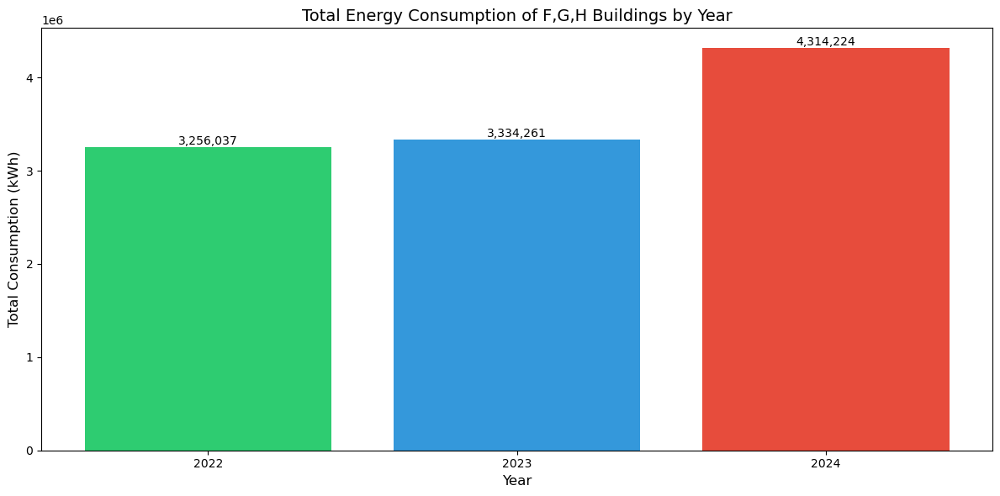

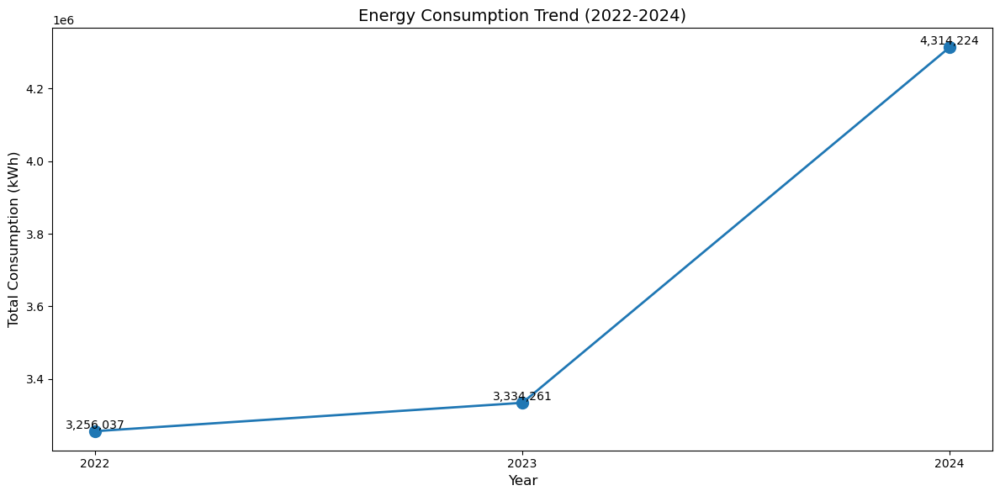

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data
df = pd.read_csv('imputed_modelling_gas_data.csv')

# Calculate yearly consumption
yearly_consumption = {
    '2022': df.filter(like='2022').sum().sum(),
    '2023': df.filter(like='2023').sum().sum(),
    '2024': df.filter(like='2024').sum().sum()
}

# Convert to DataFrame
yearly_df = pd.DataFrame(yearly_consumption.items(), columns=['Year', 'Consumption'])

# Create bar plot
plt.figure(figsize=(12, 6))
plt.bar(yearly_df['Year'], yearly_df['Consumption'], 
        color=['#2ecc71', '#3498db', '#e74c3c'])
plt.title('Total Energy Consumption of F,G,H Buildings by Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Consumption (kWh)', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(yearly_df['Consumption']):
    plt.text(i, v, f'{v:,.0f}', ha='center', va='bottom')

plt.grid(True, axis='y', linestyle='', alpha=0.7)
plt.tight_layout()
plt.show()

# Create line plot for trend
plt.figure(figsize=(12, 6))
plt.plot(yearly_df['Year'], yearly_df['Consumption'],
         marker='o', linewidth=2, markersize=10)
plt.title('Energy Consumption Trend (2022-2024)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Consumption (kWh)', fontsize=12)
plt.grid(True, linestyle='', alpha=0.7)

# Add value labels
for i, v in enumerate(yearly_df['Consumption']):
    plt.text(i, v, f'{v:,.0f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


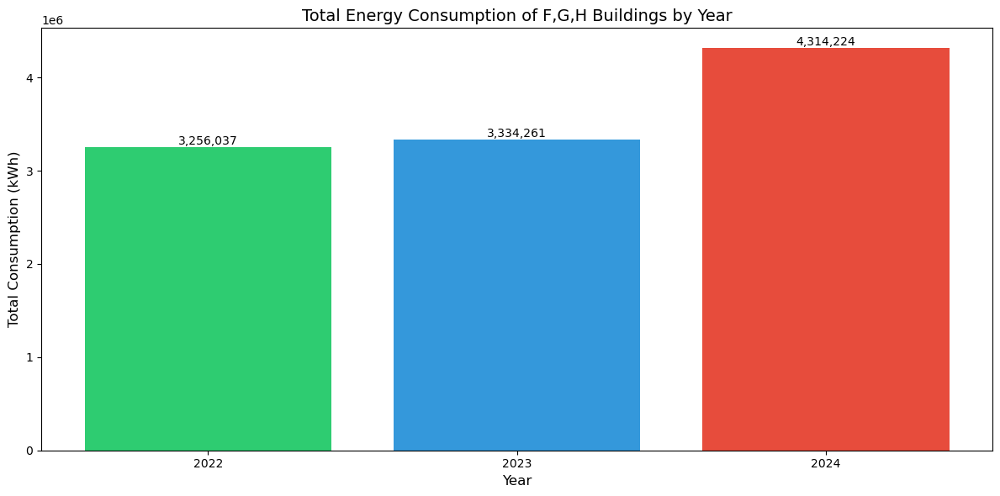

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the data
df = pd.read_csv('imputed_modelling_gas_data.csv')

# Calculate yearly consumption
yearly_consumption = {
    '2022': df.filter(like='2022').sum().sum(),
    '2023': df.filter(like='2023').sum().sum(),
    '2024': df.filter(like='2024').sum().sum()
}

# Convert to DataFrame
yearly_df = pd.DataFrame(yearly_consumption.items(), columns=['Year', 'Consumption'])

# Create bar plot
plt.figure(figsize=(12, 6))
plt.bar(yearly_df['Year'], yearly_df['Consumption'], 
        color=['#2ecc71', '#3498db', '#e74c3c'])
plt.title('Total Energy Consumption of F,G,H Buildings by Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Consumption (kWh)', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(yearly_df['Consumption']):
    plt.text(i, v, f'{v:,.0f}', ha='center', va='bottom')

plt.grid(True, axis='y', linestyle='', alpha=0.7)
plt.tight_layout()
plt.show()


In [5]:
def detect_anomalies(threshold=3):
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
    anomalies = (z_scores > threshold).any(axis=1)
    return df[anomalies]


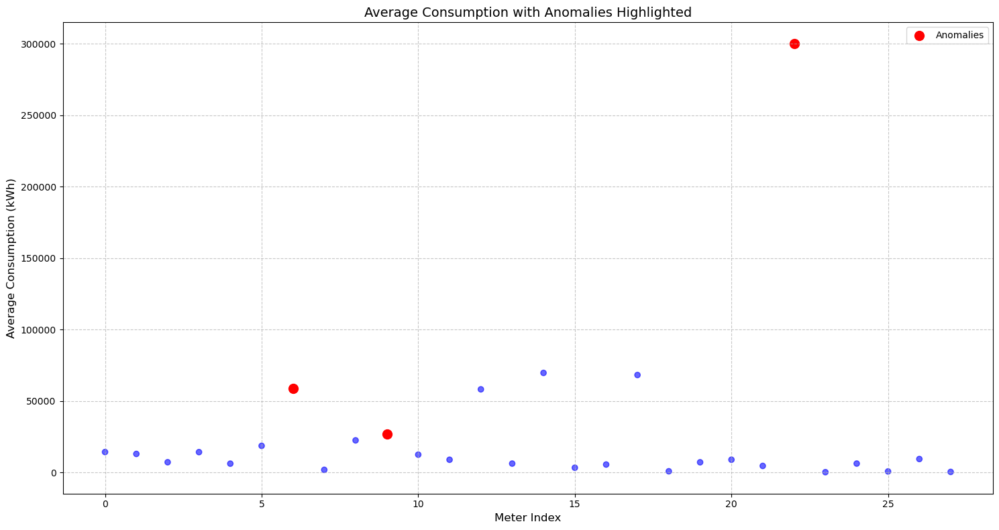


Anomalous Meter Locations:
6     F940 PLAZA BUILDING,132 ANZAC AVENUE,FORSYTH
9       G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE
22          ECCLES GREAT KING STREET,UNIVERSITY OF
Name: Meter_location, dtype: object


In [121]:

# Read the data
df = pd.read_csv('automated_meters.csv')

# Calculate z-scores for numeric columns
numeric_df = df.select_dtypes(include=[np.number])
z_scores = np.abs(stats.zscore(numeric_df))

# Identify anomalies (z-score > 3)
threshold = 3
anomalies = (z_scores > threshold).any(axis=1)

# Create scatter plot of anomalies
plt.figure(figsize=(15, 8))
plt.scatter(range(len(df)), df.iloc[:, 1:].mean(axis=1), 
           c=['red' if x else 'blue' for x in anomalies],
           alpha=0.6)

# Highlight anomalies
anomaly_points = df[anomalies].iloc[:, 1:].mean(axis=1)
plt.scatter(anomaly_points.index, anomaly_points, 
           color='red', s=100, label='Anomalies')

plt.title('Average Consumption with Anomalies Highlighted', fontsize=14)
plt.xlabel('Meter Index', fontsize=12)
plt.ylabel('Average Consumption (kWh)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print anomalous meter locations
print("\nAnomalous Meter Locations:")
print(df[anomalies]['Meter_location'])


In [3]:
# Normalize each meter's readings by its maximum value or building size
def normalize_meter_readings(df):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    normalized_df = df.copy()
    for col in numeric_cols:
        normalized_df[col] = df[col] / df[col].max()
    return normalized_df


In [5]:
# Use IQR (Interquartile Range) method which is more robust
def detect_anomalies_iqr(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return ((df < lower_bound) | (df > upper_bound)).any(axis=1)


In [7]:
# Group by months to consider seasonal patterns
def detect_seasonal_anomalies(df):
    # Extract month from column names
    monthly_avg = df.groupby(df.index % 12).mean()
    monthly_std = df.groupby(df.index % 12).std()
    
    # Compare each value to its typical month behavior
    anomalies = abs(df - monthly_avg) > 3 * monthly_std
    return anomalies.any(axis=1)


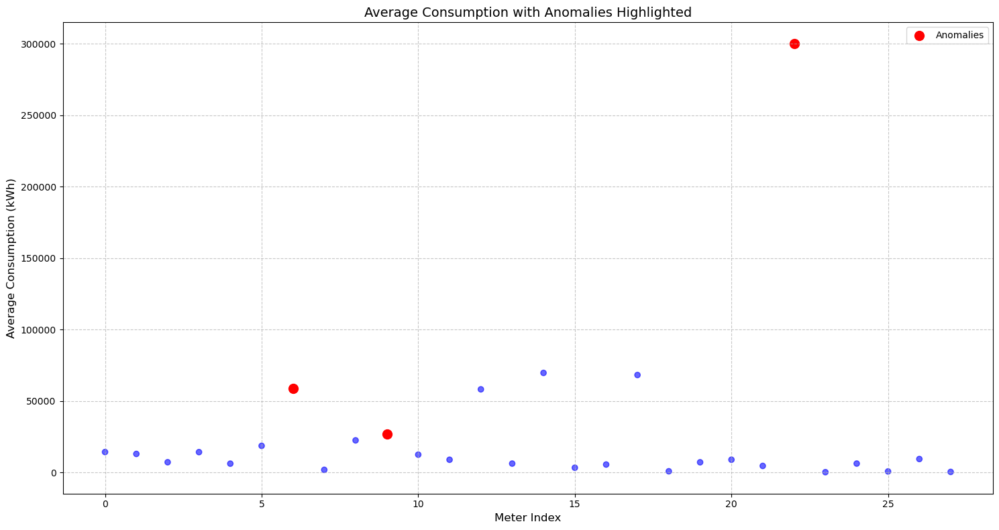


Anomalous Meter Locations:
6     F940 PLAZA BUILDING,132 ANZAC AVENUE,FORSYTH
9       G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE
22          ECCLES GREAT KING STREET,UNIVERSITY OF
Name: Meter_location, dtype: object


In [11]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

# Read the data
df = pd.read_csv('automated_meters.csv')

# Separate the Meter_location column and numerical data
locations = df['Meter_location']
numeric_data = df.select_dtypes(include=[np.number])

# Calculate z-scores for numeric columns
z_scores = pd.DataFrame(np.abs(stats.zscore(numeric_data)), 
                       index=df.index, 
                       columns=numeric_data.columns)

# Identify anomalies (z-score > 3)
threshold = 3
anomalies = (z_scores > threshold).any(axis=1)

# Calculate mean consumption for plotting
mean_consumption = numeric_data.mean(axis=1)

# Create scatter plot of anomalies
plt.figure(figsize=(15, 8))
plt.scatter(range(len(df)), mean_consumption, 
           c=['red' if x else 'blue' for x in anomalies],
           alpha=0.6)

# Highlight anomalies
anomaly_points = mean_consumption[anomalies]
plt.scatter(anomaly_points.index, anomaly_points, 
           color='red', s=100, label='Anomalies')

plt.title('Average Consumption with Anomalies Highlighted', fontsize=14)
plt.xlabel('Meter Index', fontsize=12)
plt.ylabel('Average Consumption (kWh)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print anomalous meter locations
print("\nAnomalous Meter Locations:")
print(locations[anomalies])



Building Category Analysis:
                  Average_Monthly_Consumption                               \
                                         mean            std           min   
Building_Category                                                            
Academic_General                 21402.449653   26235.592617   1788.469444   
Academic_IT                       9873.122500    6188.859786   5496.937778   
Academic_Science                 26939.810556            NaN  26939.810556   
Common_Areas                     32409.103889   37113.557321   6165.855833   
Other                            52707.851944  102227.183276    337.516389   
Residential                       6823.835093    5158.885157    153.448333   
Sports_Recreation                12413.981111            NaN  12413.981111   
Support_Services                 20252.664792   33011.759817    662.333333   

                                 Meter_location  
                             max          count  
Building_Cat

C:\Users\sugan\AppData\Local\Temp\ipykernel_25512\2323823092.py:55: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df.loc[df['Meter_location'].str.contains(building, case=False), 'Building_Category'] = category
C:\Users\sugan\AppData\Local\Temp\ipykernel_25512\2323823092.py:55: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df.loc[df['Meter_location'].str.contains(building, case=False), 'Building_Category'] = category
C:\Users\sugan\AppData\Local\Temp\ipykernel_25512\2323823092.py:55: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df.loc[df['Meter_location'].str.contains(building, case=False), 'Building_Category'] = category


<Figure size 1200x600 with 0 Axes>

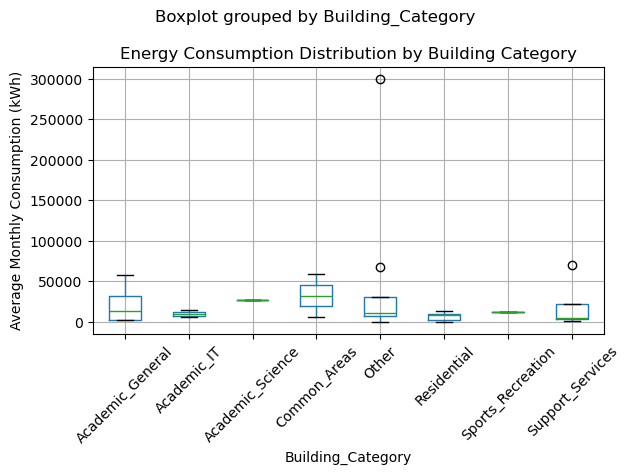

In [13]:
import pandas as pd
import numpy as np

# Read the data
df = pd.read_csv('automated_meters.csv')

# Define building categories and their corresponding buildings
building_categories = {
    'Academic_IT': [
        'F512,INFORMATION TECHNOLOGY BLDG',
        'F204,IT DEPT'
    ],
    'Academic_Science': [
        'G412,SCIENCE 2 BOILER HOUSE',
        'E208/12,ZOOLOGY (BENHAM BLDG)',
        'G404,CAMPUS (MICROBIOLOGY)',
        'D206, MEDICAL SCHOOL (HERCUS)'
    ],
    'Academic_General': [
        'F916,COLLEGE OF EDUCATION',
        'F516/17,HUMANITIES',
        'F62X,PSYCHOLOGY',
        'F603,PROPERTY SERVICES BLDG'
    ],
    'Residential': [
        'G601,UNIVERSITY COLLEGE',
        'G60X,UNIVERSITY COLLEGE 1',
        'G608,ST MARGARET\'S COLLEGE',
        'ARANA 110 CLYDE STREET',
        'AQUINAS 74 GLADSTONE ROAD',
        'MARSH STUDY CENTRE'
    ],
    'Support_Services': [
        'CHILDCARE CENTRE',
        'DENTAL',
        'PHYSIO BUILDING',
        'E902,HOCKEN LIBRARY'
    ],
    'Sports_Recreation': [
        'F405,SMITHELL\'S GYMNASIUM'
    ],
    'Common_Areas': [
        'F402,UNIVERSITY UNION BUILDING',
        'F940 PLAZA BUILDING'
    ]
}

def categorize_buildings(df, categories):
    # Create a new column for building category
    df['Building_Category'] = 'Other'
    
    # Assign categories to buildings
    for category, buildings in categories.items():
        for building in buildings:
            df.loc[df['Meter_location'].str.contains(building, case=False), 'Building_Category'] = category
    
    return df

def analyze_building_groups(df):
    # Calculate average monthly consumption for each building
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    df['Average_Monthly_Consumption'] = df[numeric_cols].mean(axis=1)
    
    # Group analysis
    group_stats = df.groupby('Building_Category').agg({
        'Average_Monthly_Consumption': ['mean', 'std', 'min', 'max'],
        'Meter_location': 'count'
    })
    
    return group_stats

# Apply the categorization
df_categorized = categorize_buildings(df, building_categories)

# Analyze the groups
group_analysis = analyze_building_groups(df_categorized)

# Print the results
print("\nBuilding Category Analysis:")
print(group_analysis)

# Optional: Visualize the groups
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
df_categorized.boxplot(column='Average_Monthly_Consumption', by='Building_Category', rot=45)
plt.title('Energy Consumption Distribution by Building Category')
plt.ylabel('Average Monthly Consumption (kWh)')
plt.tight_layout()
plt.show()


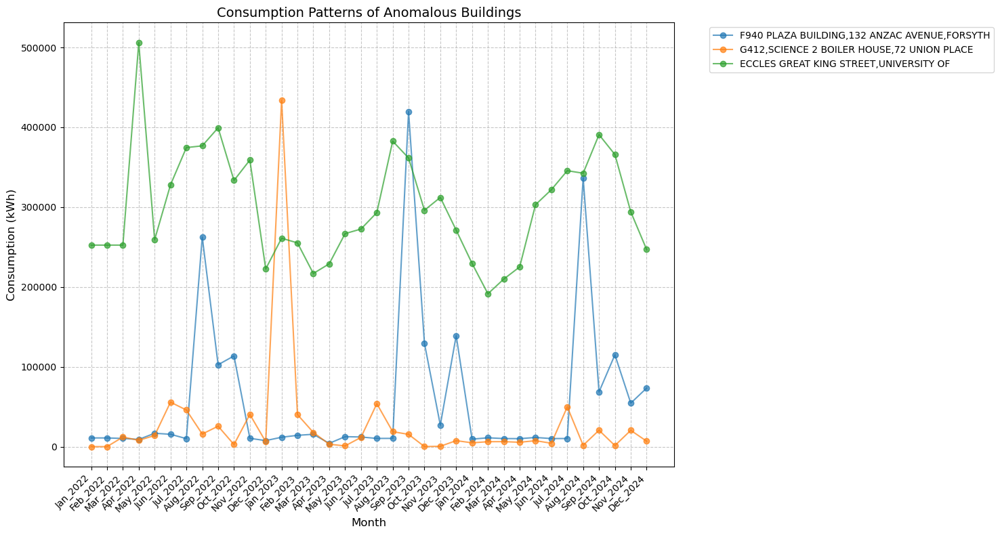


Detailed Statistics for Anomalous Buildings:

Building: F940 PLAZA BUILDING,132 ANZAC AVENUE,FORSYTH
Average Consumption: 58,652.35 kWh
Maximum Consumption: 419,596.00 kWh
Minimum Consumption: 4,302.50 kWh
Standard Deviation: 96,276.24 kWh
Total Consumption: 2,111,484.67 kWh

Building: G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE
Average Consumption: 26,939.81 kWh
Maximum Consumption: 434,059.75 kWh
Minimum Consumption: 148.92 kWh
Standard Deviation: 71,675.79 kWh
Total Consumption: 969,833.18 kWh

Building: ECCLES GREAT KING STREET,UNIVERSITY OF
Average Consumption: 300,074.44 kWh
Maximum Consumption: 505,845.66 kWh
Minimum Consumption: 191,548.00 kWh
Standard Deviation: 68,180.90 kWh
Total Consumption: 10,802,679.87 kWh


In [125]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Read the data
df = pd.read_csv('automated_meters.csv')

# Calculate z-scores and identify anomalies
numeric_df = df.select_dtypes(include=[np.number])
z_scores = np.abs(stats.zscore(numeric_df))
threshold = 3
anomalies = (z_scores > threshold).any(axis=1)

# Get anomalous buildings data
anomaly_df = df[anomalies]

# Create visualization for each anomalous building
plt.figure(figsize=(15, 8))

# Get column names excluding 'Meter_location'
months = df.columns[1:]

# Plot for each anomalous building
for idx, row in anomaly_df.iterrows():
    plt.plot(months, row[1:], marker='o', label=row['Meter_location'], alpha=0.7)

plt.title('Consumption Patterns of Anomalous Buildings', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Consumption (kWh)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print detailed statistics for anomalous buildings
print("\nDetailed Statistics for Anomalous Buildings:")
print("===========================================")
for idx, row in anomaly_df.iterrows():
    building_name = row['Meter_location']
    consumption = row[1:].astype(float)
    
    print(f"\nBuilding: {building_name}")
    print(f"Average Consumption: {consumption.mean():,.2f} kWh")
    print(f"Maximum Consumption: {consumption.max():,.2f} kWh")
    print(f"Minimum Consumption: {consumption.min():,.2f} kWh")
    print(f"Standard Deviation: {consumption.std():,.2f} kWh")
    print(f"Total Consumption: {consumption.sum():,.2f} kWh")



In [93]:
def calculate_efficiency():
    # Calculate consumption per building
    efficiency_df = df.copy()
    efficiency_df['avg_monthly_consumption'] = efficiency_df.select_dtypes(include=[np.number]).mean(axis=1)
    efficiency_df['consumption_variability'] = efficiency_df.select_dtypes(include=[np.number]).std(axis=1)
    
    return efficiency_df[['Meter_location', 'avg_monthly_consumption', 'consumption_variability']].sort_values('avg_monthly_consumption', ascending=False)


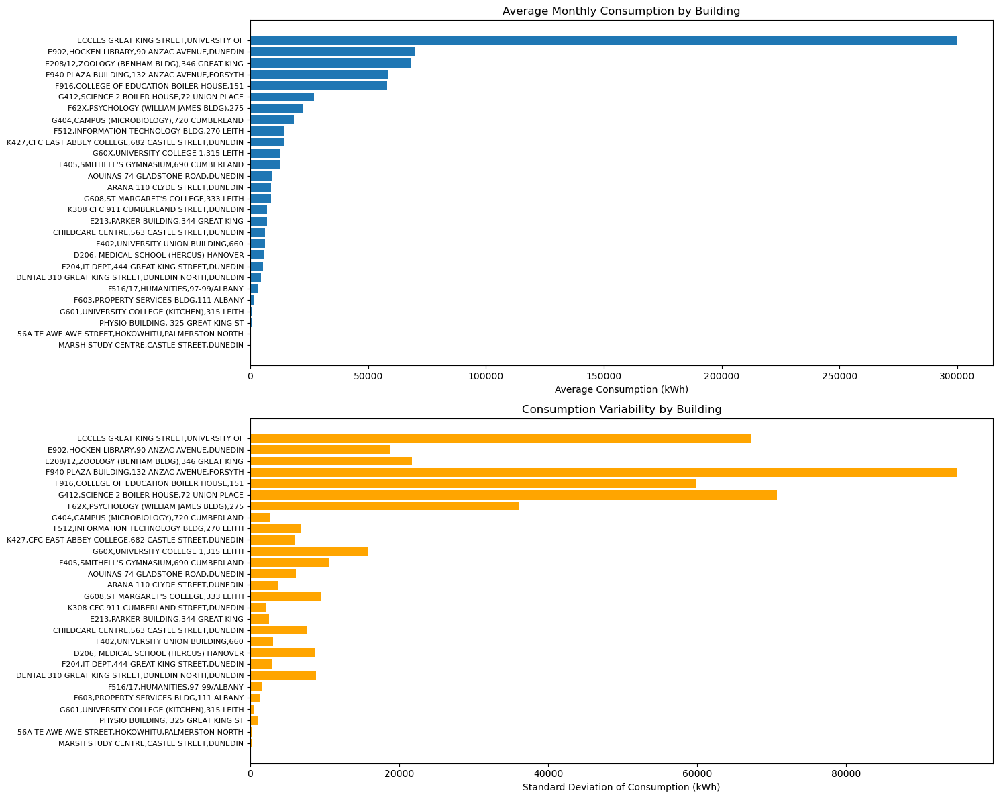

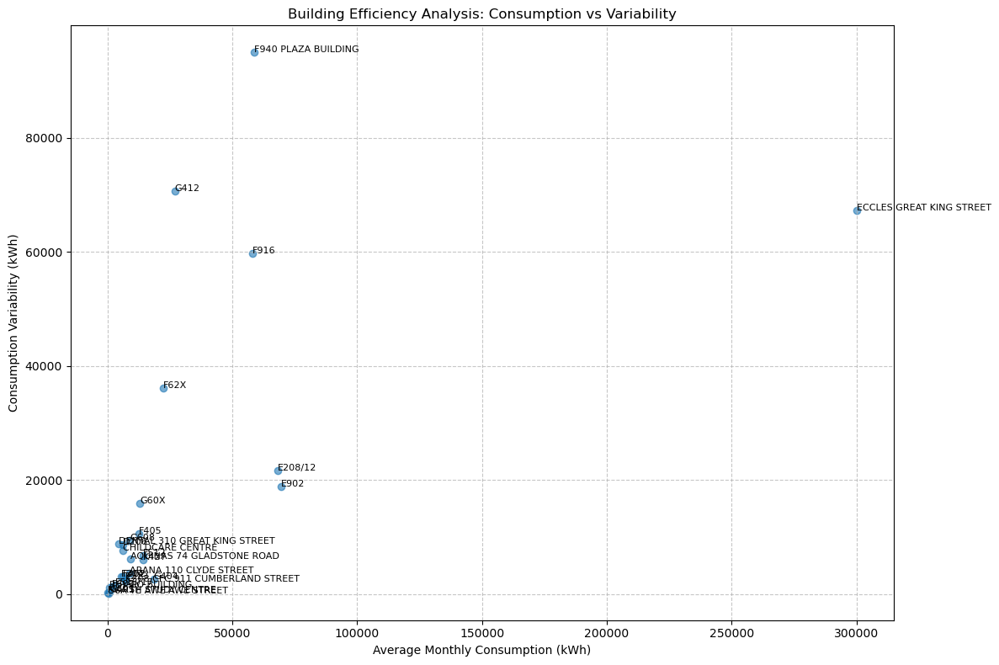

In [127]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data
df = pd.read_csv('automated_meters.csv')

# Calculate efficiency metrics
efficiency_df = df.copy()
efficiency_df['avg_monthly_consumption'] = efficiency_df.select_dtypes(include=[np.number]).mean(axis=1)
efficiency_df['consumption_variability'] = efficiency_df.select_dtypes(include=[np.number]).std(axis=1)

# Sort by average consumption
efficiency_df = efficiency_df.sort_values('avg_monthly_consumption', ascending=True)

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# Plot average monthly consumption
ax1.barh(efficiency_df['Meter_location'], efficiency_df['avg_monthly_consumption'])
ax1.set_title('Average Monthly Consumption by Building', fontsize=12)
ax1.set_xlabel('Average Consumption (kWh)', fontsize=10)
ax1.tick_params(axis='y', labelsize=8)

# Plot consumption variability
ax2.barh(efficiency_df['Meter_location'], efficiency_df['consumption_variability'], color='orange')
ax2.set_title('Consumption Variability by Building', fontsize=12)
ax2.set_xlabel('Standard Deviation of Consumption (kWh)', fontsize=10)
ax2.tick_params(axis='y', labelsize=8)

plt.tight_layout()
plt.show()

# Create scatter plot of efficiency metrics
plt.figure(figsize=(12, 8))
plt.scatter(efficiency_df['avg_monthly_consumption'], 
           efficiency_df['consumption_variability'],
           alpha=0.6)

# Add building labels
for i, txt in enumerate(efficiency_df['Meter_location']):
    plt.annotate(txt.split(',')[0], 
                (efficiency_df['avg_monthly_consumption'].iloc[i], 
                 efficiency_df['consumption_variability'].iloc[i]),
                fontsize=8)

plt.xlabel('Average Monthly Consumption (kWh)')
plt.ylabel('Consumption Variability (kWh)')
plt.title('Building Efficiency Analysis: Consumption vs Variability')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [97]:
def analyze_correlations():
    # Calculate correlations between months
    corr_matrix = df.select_dtypes(include=[np.number]).corr()
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, cmap='coolwarm', center=0)
    plt.title('Consumption Correlation Between Months')
    plt.show()


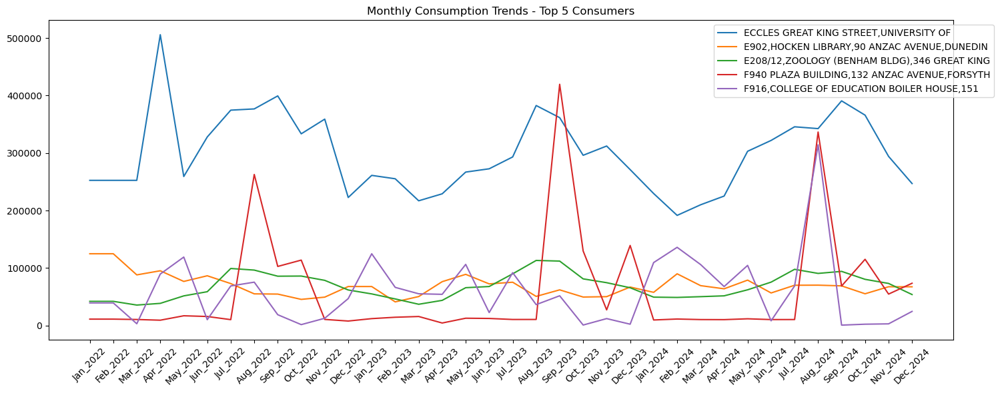

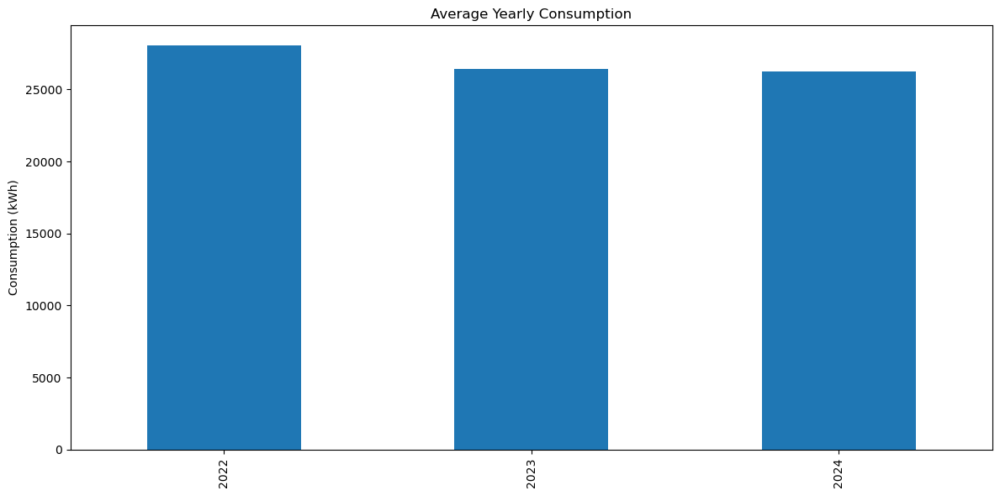

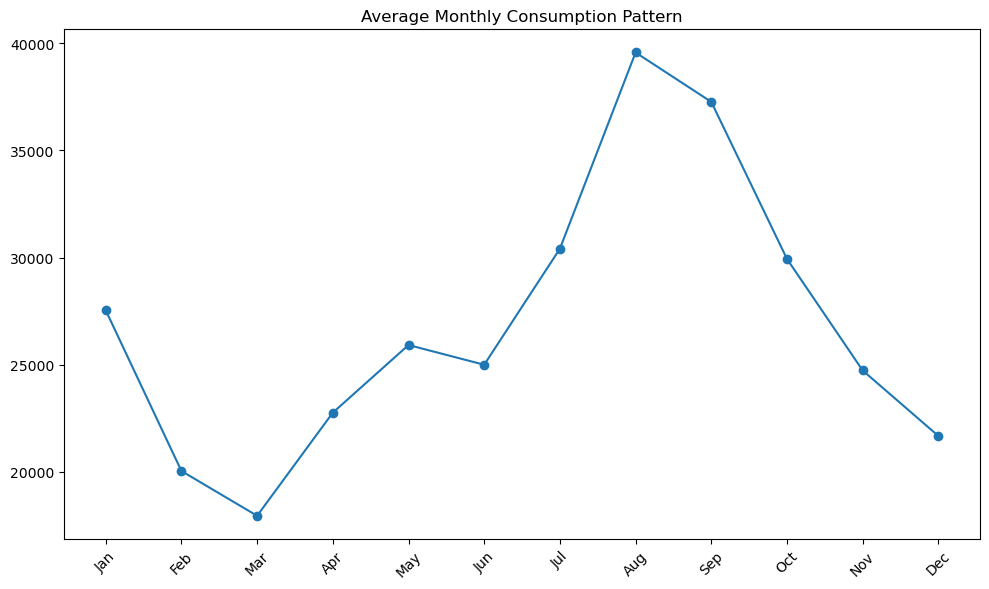

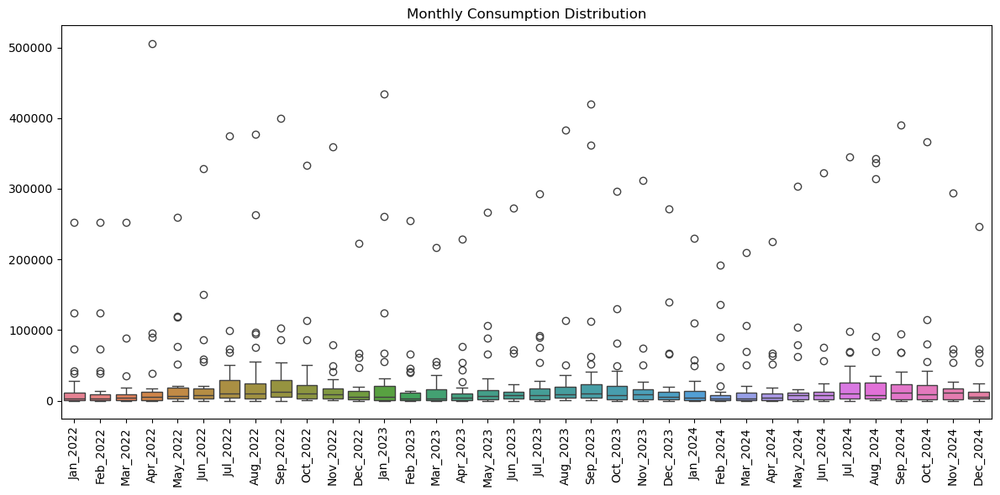

In [99]:

# Read the data
df = pd.read_csv('automated_meters.csv')

# 1. Monthly Consumption Trends for Top 5 Consumers
plt.figure(figsize=(15, 6))
top_5_meters = df.iloc[:, 1:].mean(axis=1).nlargest(5).index
for idx in top_5_meters:
    plt.plot(df.columns[1:], df.iloc[idx, 1:], label=df.iloc[idx, 0])
plt.title('Monthly Consumption Trends - Top 5 Consumers')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

# 2. Yearly Average Consumption by Building
yearly_avg = pd.DataFrame({
    '2022': df.filter(like='2022').mean(axis=1),
    '2023': df.filter(like='2023').mean(axis=1),
    '2024': df.filter(like='2024').mean(axis=1)
})
yearly_avg.index = df['Meter_location']

plt.figure(figsize=(12, 6))
yearly_avg.mean().plot(kind='bar')
plt.title('Average Yearly Consumption')
plt.ylabel('Consumption (kWh)')
plt.tight_layout()
plt.show()

# 3. Seasonal Patterns
def get_monthly_avg(df):
    monthly_avgs = []
    for month in ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                  'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']:
        cols = [col for col in df.columns if col.startswith(month)]
        monthly_avgs.append(df[cols].mean().mean())
    return monthly_avgs

plt.figure(figsize=(10, 6))
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.plot(months, get_monthly_avg(df.iloc[:, 1:]), marker='o')
plt.title('Average Monthly Consumption Pattern')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 4. Consumption Distribution
plt.figure(figsize=(12, 6))
sns.boxplot(data=df.iloc[:, 1:])
plt.title('Monthly Consumption Distribution')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


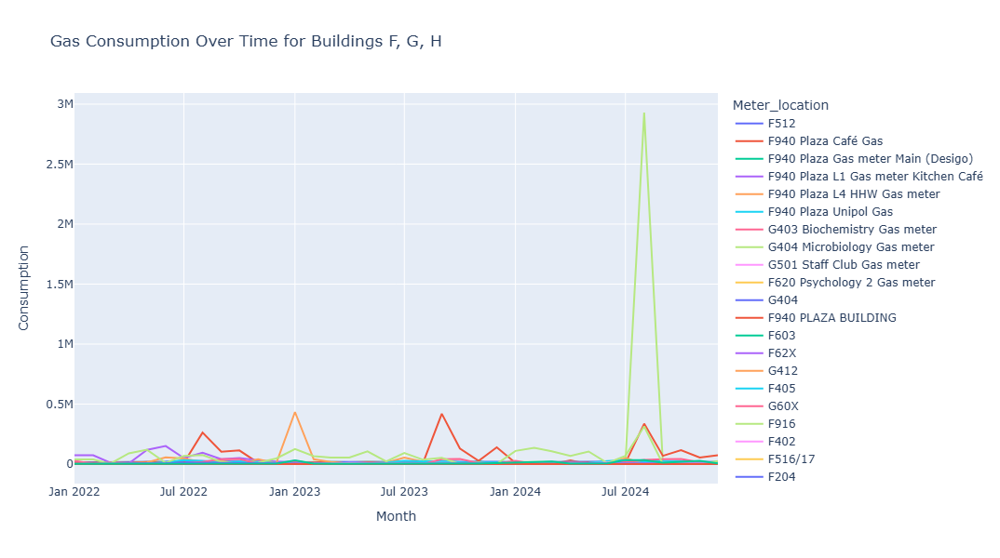

In [5]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

# Load and prepare the data
df = pd.read_csv('cleaned_gas_data.csv')
df['Meter_location'] = df['Meter_location'].str.split(',').str[0]
df_melted = df.melt(id_vars=['Meter_location'], var_name='Month', value_name='Consumption')
df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b_%Y')
df_melted = df_melted.sort_values('Month')

# Filter for buildings starting with F, G, H
buildings_fgh = df[df['Meter_location'].str[0].isin(['F', 'G', 'H'])]

# 1. Interactive Time Series Plot
fig = px.line(df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])], 
              x='Month', y='Consumption', color='Meter_location',
              title='Gas Consumption Over Time for Buildings F, G, H')
fig.update_layout(height=600, width=1000)
fig.show()

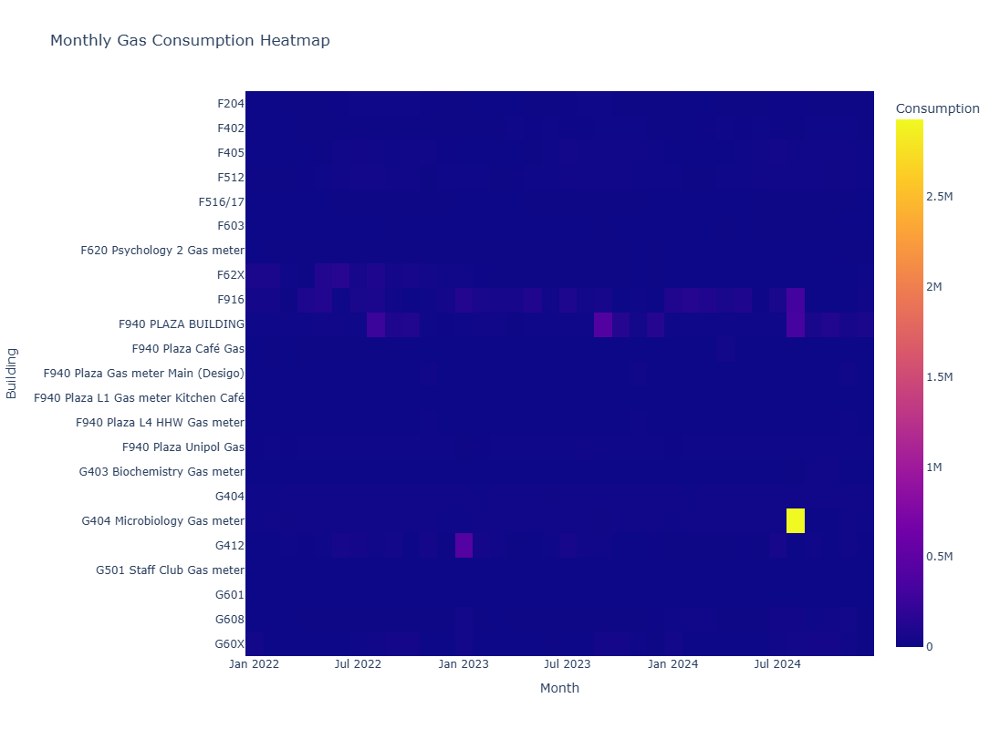

In [9]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

# Load and prepare the data
df = pd.read_csv('cleaned_gas_data.csv')
df['Meter_location'] = df['Meter_location'].str.split(',').str[0]
df_melted = df.melt(id_vars=['Meter_location'], var_name='Month', value_name='Consumption')
df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b_%Y')
df_melted = df_melted.sort_values('Month')

# Filter for buildings starting with F, G, H
buildings_fgh = df[df['Meter_location'].str[0].isin(['F', 'G', 'H'])]
# 2. Heatmap of Monthly Consumption
pivot_df = df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])].pivot(index='Meter_location', columns='Month', values='Consumption')
fig = px.imshow(pivot_df, 
                labels=dict(x="Month", y="Building", color="Consumption"),
                title="Monthly Gas Consumption Heatmap")
fig.update_layout(height=800, width=1200)
fig.show()

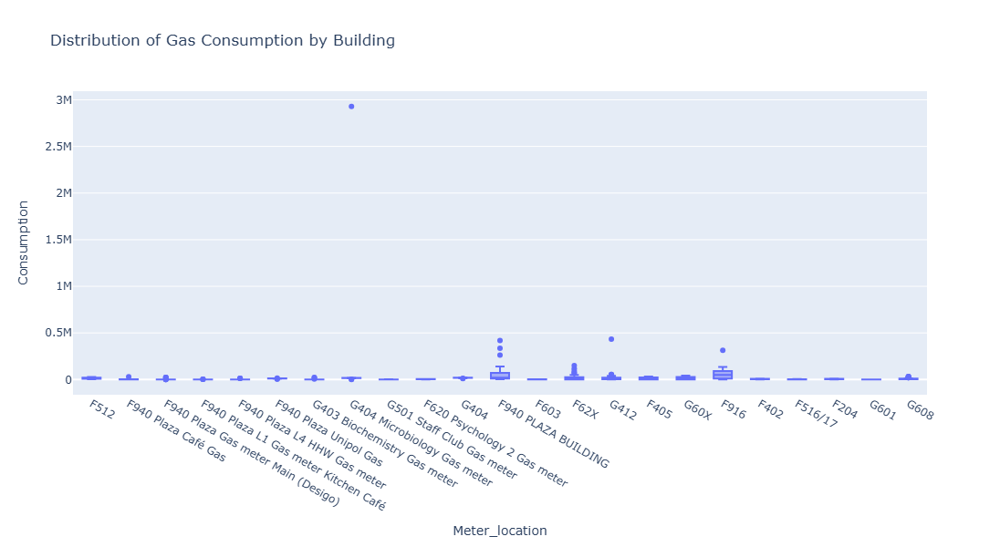

In [11]:
# 3. Box Plot of Consumption Distribution
fig = px.box(df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])], 
             x='Meter_location', y='Consumption',
             title='Distribution of Gas Consumption by Building')
fig.update_layout(height=600, width=1000)
fig.show()

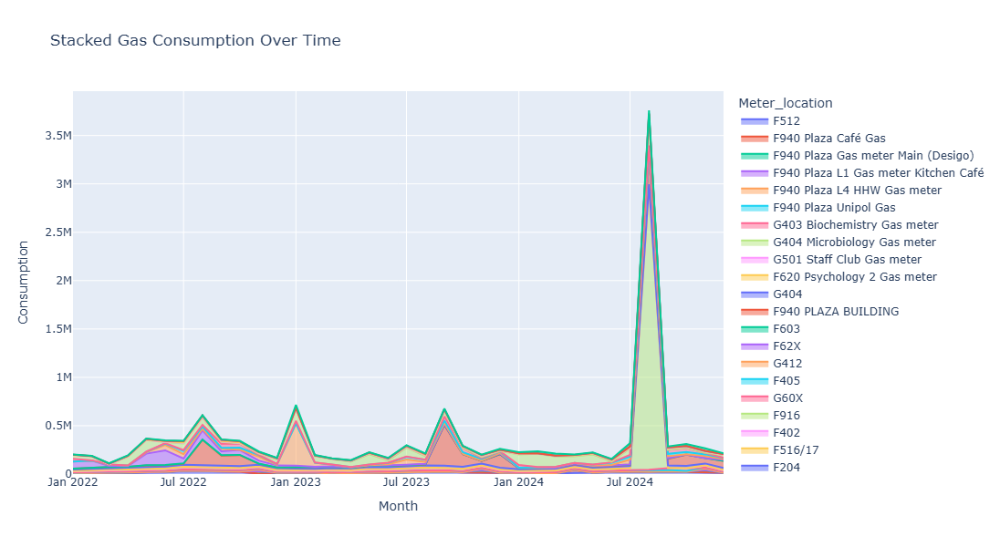

In [13]:
# 4. Stacked Area Chart
fig = px.area(df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])], 
              x='Month', y='Consumption', color='Meter_location',
              title='Stacked Gas Consumption Over Time')
fig.update_layout(height=600, width=1000)
fig.show()

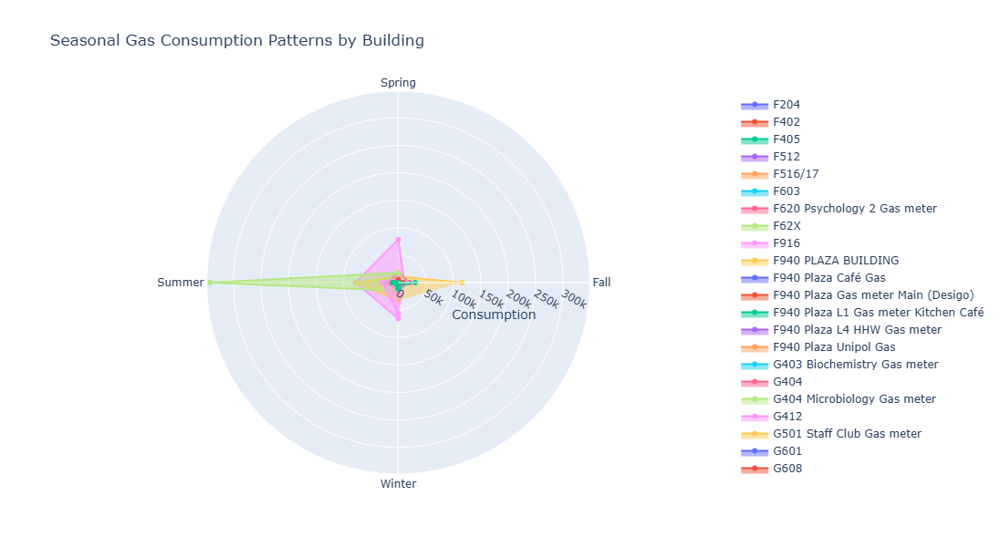

In [17]:
# 5. Radar Chart for Seasonal Patterns
# Create a copy of the filtered dataframe
seasonal_df = df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])].copy()

# Map months to seasons using loc
season_map = {12:'Winter', 1:'Winter', 2:'Winter',
              3:'Spring', 4:'Spring', 5:'Spring',
              6:'Summer', 7:'Summer', 8:'Summer',
              9:'Fall', 10:'Fall', 11:'Fall'}

seasonal_df.loc[:, 'Season'] = seasonal_df['Month'].dt.month.map(season_map)

# Calculate seasonal averages
seasonal_avg = seasonal_df.groupby(['Meter_location', 'Season'])['Consumption'].mean().unstack()

# Create radar chart
fig = go.Figure()

for building in seasonal_avg.index:
    fig.add_trace(go.Scatterpolar(
        r=seasonal_avg.loc[building],
        theta=seasonal_avg.columns,
        fill='toself',
        name=building
    ))

# Update layout with better formatting
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            title='Consumption'
        )
    ),
    showlegend=True,
    title='Seasonal Gas Consumption Patterns by Building',
    height=600,
    width=800
)

fig.show()


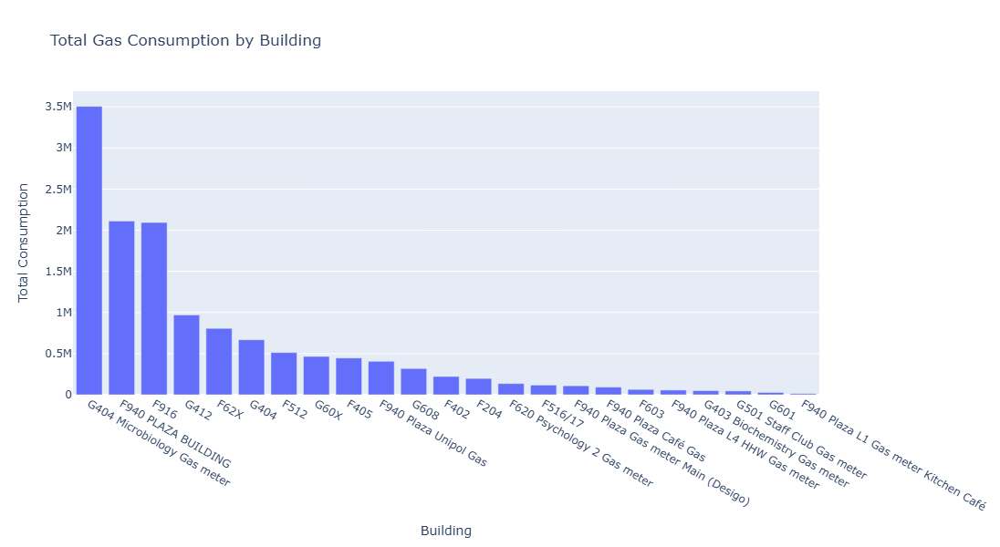

In [19]:
# 6. Bar Chart of Total Consumption
total_consumption = df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])].groupby('Meter_location')['Consumption'].sum().sort_values(ascending=False)
fig = px.bar(x=total_consumption.index, y=total_consumption.values,
             labels={'x':'Building', 'y':'Total Consumption'},
             title='Total Gas Consumption by Building')
fig.update_layout(height=600, width=1000)
fig.show()

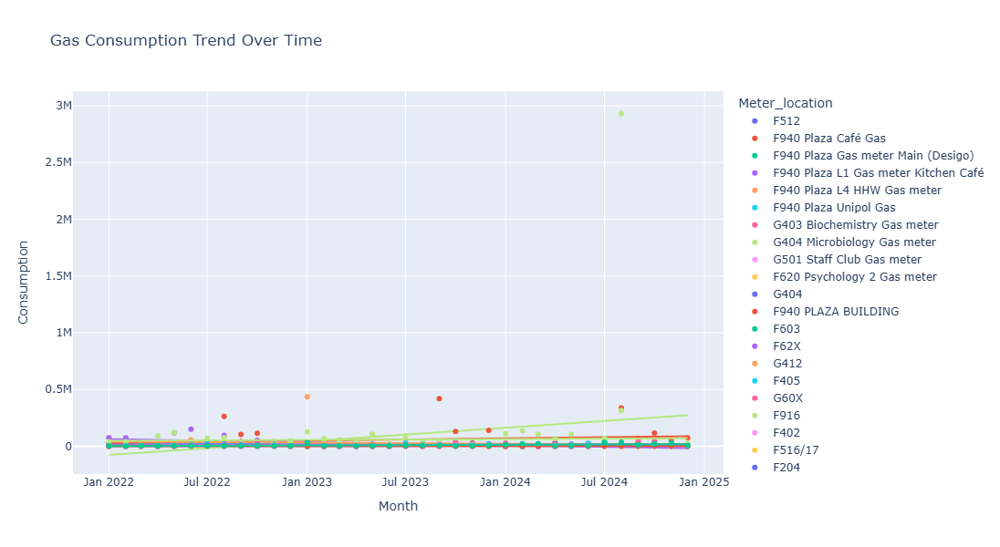

In [21]:
# 7. Scatter Plot of Consumption vs Time with Trendline
fig = px.scatter(df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])], 
                 x='Month', y='Consumption', color='Meter_location', 
                 trendline="ols", title='Gas Consumption Trend Over Time')
fig.update_layout(height=600, width=1000)
fig.show()

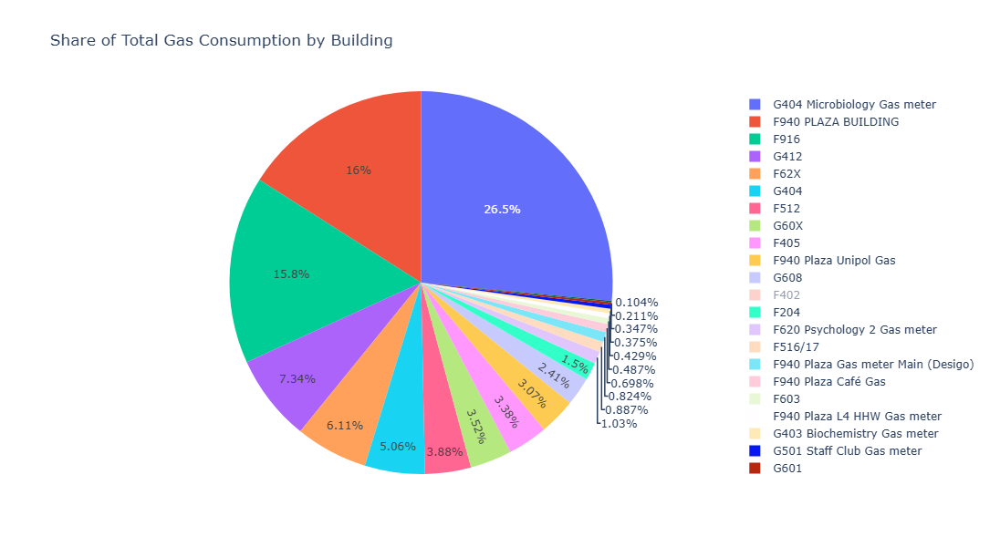

In [25]:
# 8. Pie Chart of Total Consumption Share
fig = px.pie(values=total_consumption.values, names=total_consumption.index,
             title='Share of Total Gas Consumption by Building')
fig.update_layout(height=600, width=900)
fig.show()

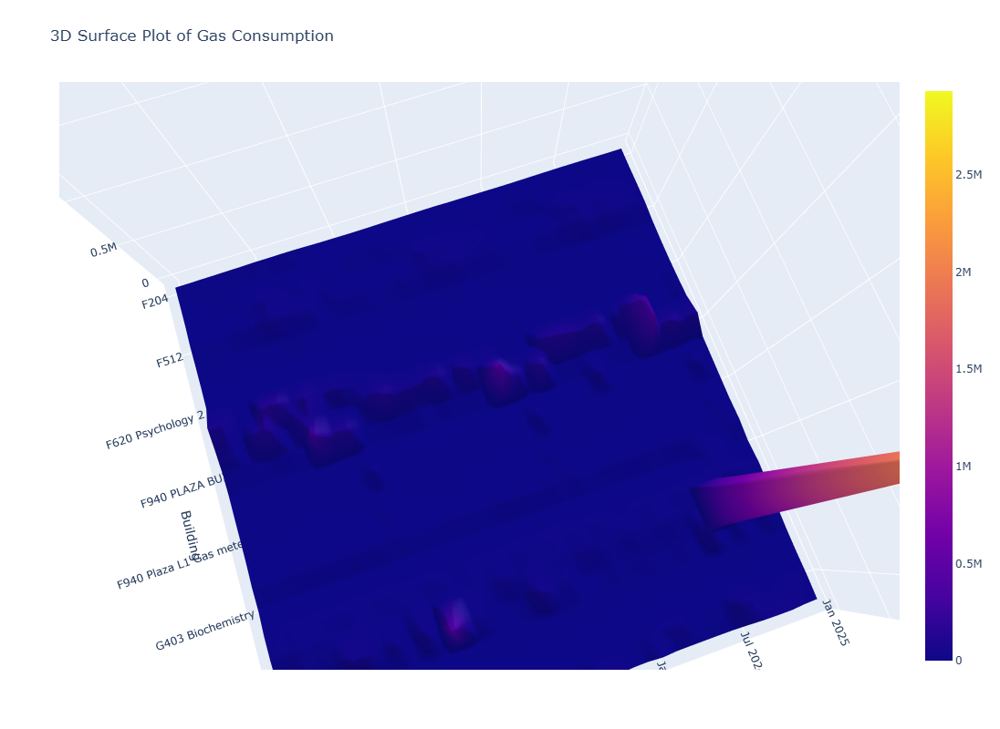

In [31]:
# 9. 3D Surface Plot of Consumption Over Time and Buildings
pivot_df = df_melted[df_melted['Meter_location'].isin(buildings_fgh['Meter_location'])].pivot(index='Month', columns='Meter_location', values='Consumption')
fig = go.Figure(data=[go.Surface(z=pivot_df.values, x=pivot_df.columns, y=pivot_df.index)])
fig.update_layout(title='3D Surface Plot of Gas Consumption', autosize=False,
                  scene=dict(xaxis_title='Building', yaxis_title='Month', zaxis_title='Consumption'),
                  width=1000, height=800, margin=dict(l=65, r=50, b=65, t=90))
fig.show()


In [47]:
import pandas as pd
import numpy as np

# Read the CSV file
df = pd.read_csv('cleaned_gas_data.csv')

# Extract building codes using string operations
df['Building_Code'] = df['Meter_location'].str.extract(r'([A-Z]\d{3})')

# Filter for buildings starting with F, G, or H
buildings_fgh = df[df['Building_Code'].str.startswith(('F', 'G', 'H'), na=False)]

# Melt the dataframe to convert months to rows
df_melted = pd.melt(buildings_fgh, 
                    id_vars=['Meter_location', 'Building_Code'],
                    var_name='Month',
                    value_name='Consumption')

# Convert Month column to datetime
df_melted['Month'] = pd.to_datetime(df_melted['Month'], format='%b_%Y')

# Calculate basic statistics for each building
building_stats = df_melted.groupby('Building_Code').agg({
    'Consumption': ['mean', 'std', 'min', 'max', 'count']
}).round(2)

# Calculate total consumption for each building
total_consumption = df_melted.groupby('Building_Code')['Consumption'].sum().sort_values(ascending=False)

print("\nBuilding Statistics-Gas:")
print(building_stats)
print("\nTotal Consumption by Building (sorted):")
print(total_consumption)

# Save results to CSV files
building_stats.to_csv('building_stats_FGH.csv')
total_consumption.to_csv('total_consumption_FGH.csv')



Building Statistics-Gas:
              Consumption                                      
                     mean        std      min         max count
Building_Code                                                  
F204              5496.94    3017.24   920.79    11847.49    36
F402              6165.86    3114.34    48.22    11632.00    36
F405             12413.98   10669.11     0.00    33051.58    36
F512             14249.31    6810.63  3283.57    27969.03    36
F516              3257.03    1520.30  1003.69     6539.21    36
F603              1788.47    1337.89   105.00     4637.00    36
F620              3779.15    1572.23  1061.37     6085.17    36
F916             58143.68   60611.28   613.00   314414.00    36
F940             12913.84   44224.62     0.00   419596.00   216
G403              1376.28    4877.25     6.36    21851.60    36
G404             57979.13  343225.95  1944.72  2929740.62    72
G412             26939.81   71675.79   148.92   434059.75    36
G501          

In [35]:
# Additional analysis code

# Monthly trends
monthly_avg = df_melted.groupby(['Building_Code', df_melted['Month'].dt.month])['Consumption'].mean().unstack()

# Year-over-year comparison
yearly_consumption = df_melted.groupby(['Building_Code', df_melted['Month'].dt.year])['Consumption'].sum().unstack()

# Percentage change year-over-year
pct_change = yearly_consumption.pct_change(axis=1) * 100

# Save additional results
monthly_avg.to_csv('monthly_averages_FGH.csv')
yearly_consumption.to_csv('yearly_consumption_FGH.csv')
pct_change.to_csv('yearly_percentage_change_FGH.csv')


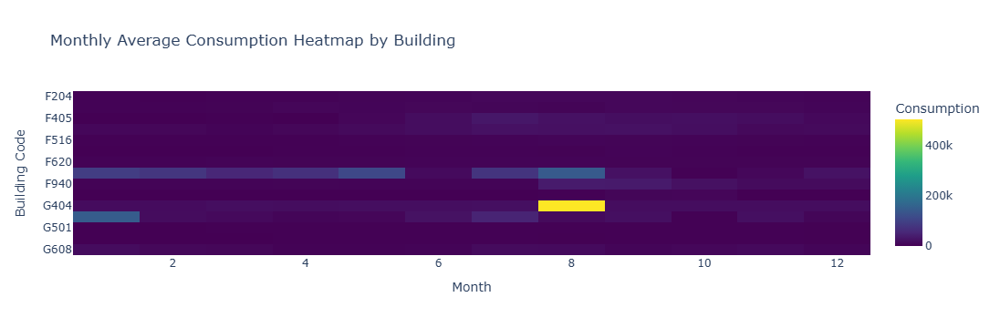

In [39]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Monthly Trends Heatmap
fig_heatmap = px.imshow(monthly_avg,
                        title='Monthly Average Consumption Heatmap by Building',
                        labels=dict(x='Month', y='Building Code', color='Consumption'),
                        aspect='auto',
                        color_continuous_scale='Viridis')
fig_heatmap.update_layout(height=800)
fig_heatmap.show()

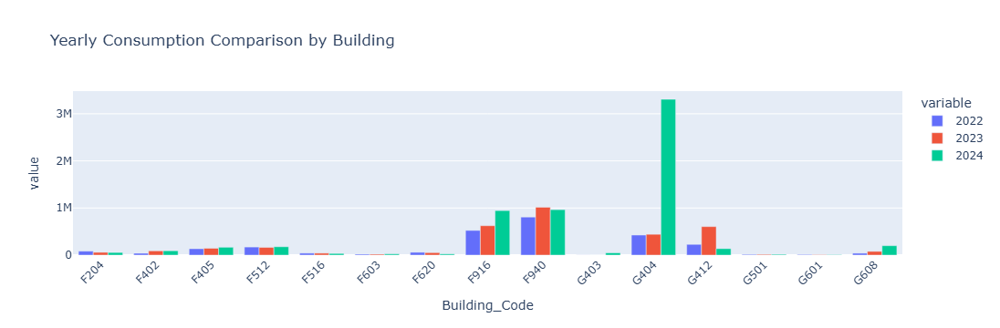

In [41]:
# 2. Year-over-Year Comparison Bar Chart
fig_yearly = px.bar(yearly_consumption.reset_index(),
                    x='Building_Code',
                    y=yearly_consumption.columns,
                    title='Yearly Consumption Comparison by Building',
                    barmode='group')
fig_yearly.update_layout(height=600,
                        xaxis_tickangle=-45)
fig_yearly.show()

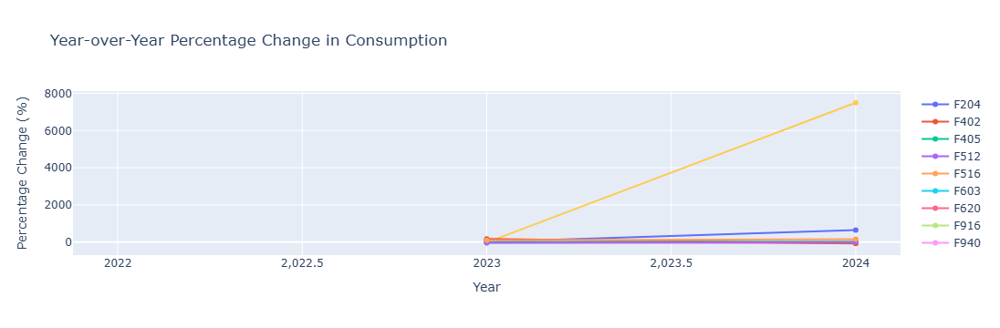

In [43]:
# 3. Percentage Change Line Plot
fig_pct = go.Figure()
for building in pct_change.index:
    fig_pct.add_trace(go.Scatter(
        x=pct_change.columns,
        y=pct_change.loc[building],
        name=building,
        mode='lines+markers'
    ))
fig_pct.update_layout(
    title='Year-over-Year Percentage Change in Consumption',
    xaxis_title='Year',
    yaxis_title='Percentage Change (%)',
    height=600,
    showlegend=True
)
fig_pct.show()


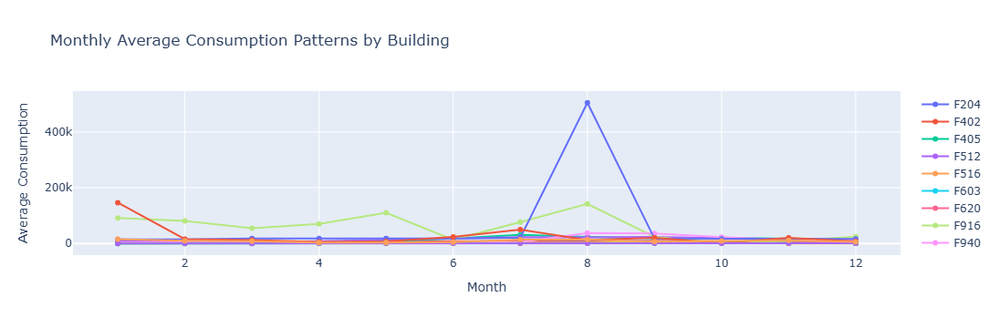

In [45]:
# 4. Monthly Trends by Building
fig_monthly = make_subplots(rows=1, cols=1)
for building in monthly_avg.index:
    fig_monthly.add_trace(
        go.Scatter(x=monthly_avg.columns,
                  y=monthly_avg.loc[building],
                  name=building,
                  mode='lines+markers')
    )
fig_monthly.update_layout(
    title='Monthly Average Consumption Patterns by Building',
    xaxis_title='Month',
    yaxis_title='Average Consumption',
    height=600,
    showlegend=True
)
fig_monthly.show()

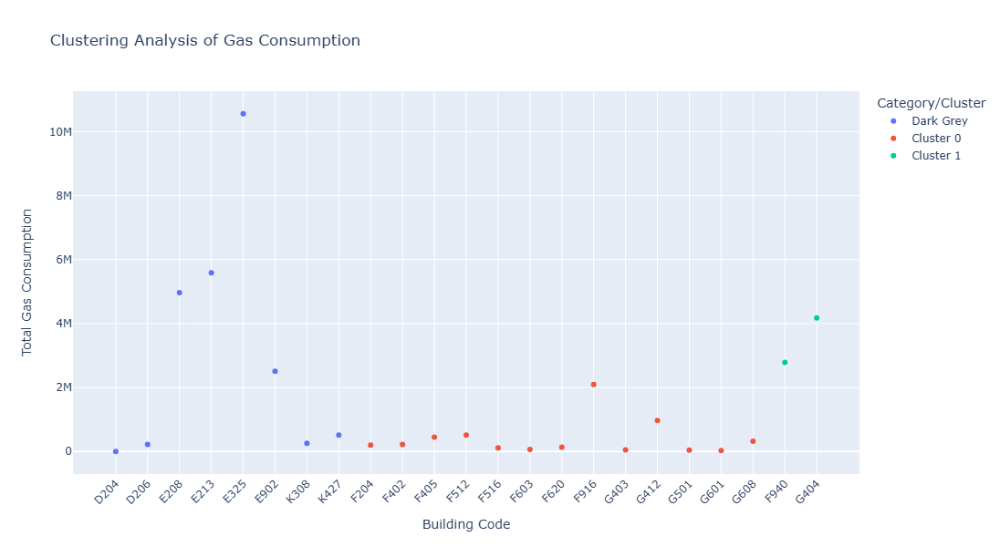

In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import plotly.express as px

# Load and prepare data
data = pd.read_csv('cleaned_gas_data.csv')

# Extract building codes and filter for valid codes
data['Building_Code'] = data['Meter_location'].str.extract(r'([A-Z]\d{3})')
data = data.dropna(subset=['Building_Code'])

# Reshape data
data_melted = pd.melt(data, 
                      id_vars=['Building_Code'], 
                      var_name='Month', 
                      value_name='Consumption')

# Convert consumption to numeric
data_melted['Consumption'] = pd.to_numeric(data_melted['Consumption'], errors='coerce')

# Aggregate total consumption by building
data_aggregated = data_melted.groupby('Building_Code')['Consumption'].sum().reset_index()

# Prepare data for clustering
X = data_aggregated[['Consumption']].values

# Perform KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
data_aggregated['Cluster'] = kmeans.fit_predict(X)

# Create color coding
data_aggregated['Category'] = data_aggregated['Building_Code'].apply(
    lambda x: 'Dark Grey' if not x.startswith(('F', 'G', 'H')) 
    else f'Cluster {data_aggregated.loc[data_aggregated.Building_Code == x, "Cluster"].iloc[0]}'
)

# Create interactive plot
fig = px.scatter(data_aggregated,
                 x='Building_Code',
                 y='Consumption',
                 color='Category',
                 title='Clustering Analysis of Gas Consumption',
                 labels={'Consumption': 'Total Gas Consumption',
                        'Building_Code': 'Building Code'},
                 height=600,
                 width=1000)

# Update layout
fig.update_layout(
    xaxis_tickangle=-45,
    showlegend=True,
    legend_title='Category/Cluster'
)

fig.show()


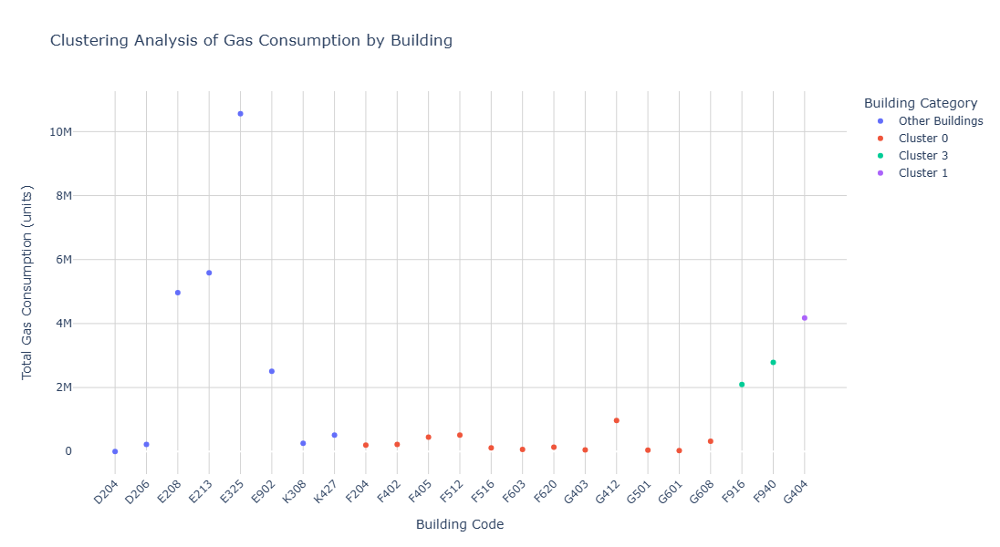

In [51]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objects as go

# Load and prepare data
data = pd.read_csv('cleaned_gas_data.csv')

# Extract building codes and prepare data
data['Building_Code'] = data['Meter_location'].str.extract(r'([A-Z]\d{3})')
data_melted = pd.melt(data, 
                      id_vars=['Building_Code'], 
                      var_name='Month', 
                      value_name='Consumption')
data_melted['Consumption'] = pd.to_numeric(data_melted['Consumption'], errors='coerce')
data_melted = data_melted.dropna(subset=['Building_Code', 'Consumption'])

# Aggregate total consumption by building
building_consumption = data_melted.groupby('Building_Code')['Consumption'].sum().reset_index()

# Perform clustering
X = building_consumption[['Consumption']].values
kmeans = KMeans(n_clusters=4, random_state=42)
building_consumption['Cluster'] = kmeans.fit_predict(X)

# Add category for F, G, H buildings
building_consumption['Category'] = building_consumption['Building_Code'].apply(
    lambda x: f'Cluster {building_consumption.loc[building_consumption.Building_Code == x, "Cluster"].iloc[0]}'
    if x.startswith(('F', 'G', 'H')) else 'Other Buildings'
)

# Create scatter plot
fig = px.scatter(building_consumption,
                 x='Building_Code',
                 y='Consumption',
                 color='Category',
                 title='Clustering Analysis of Gas Consumption by Building',
                 labels={'Consumption': 'Total Gas Consumption',
                        'Building_Code': 'Building Code'},
                 height=600,
                 width=1000)

# Update layout
fig.update_layout(
    xaxis_tickangle=-45,
    showlegend=True,
    legend_title='Building Category',
    yaxis_title='Total Gas Consumption (units)',
    plot_bgcolor='white'
)

# Add grid lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')

fig.show()

# Save plot
fig.write_html('building_clusters.html')


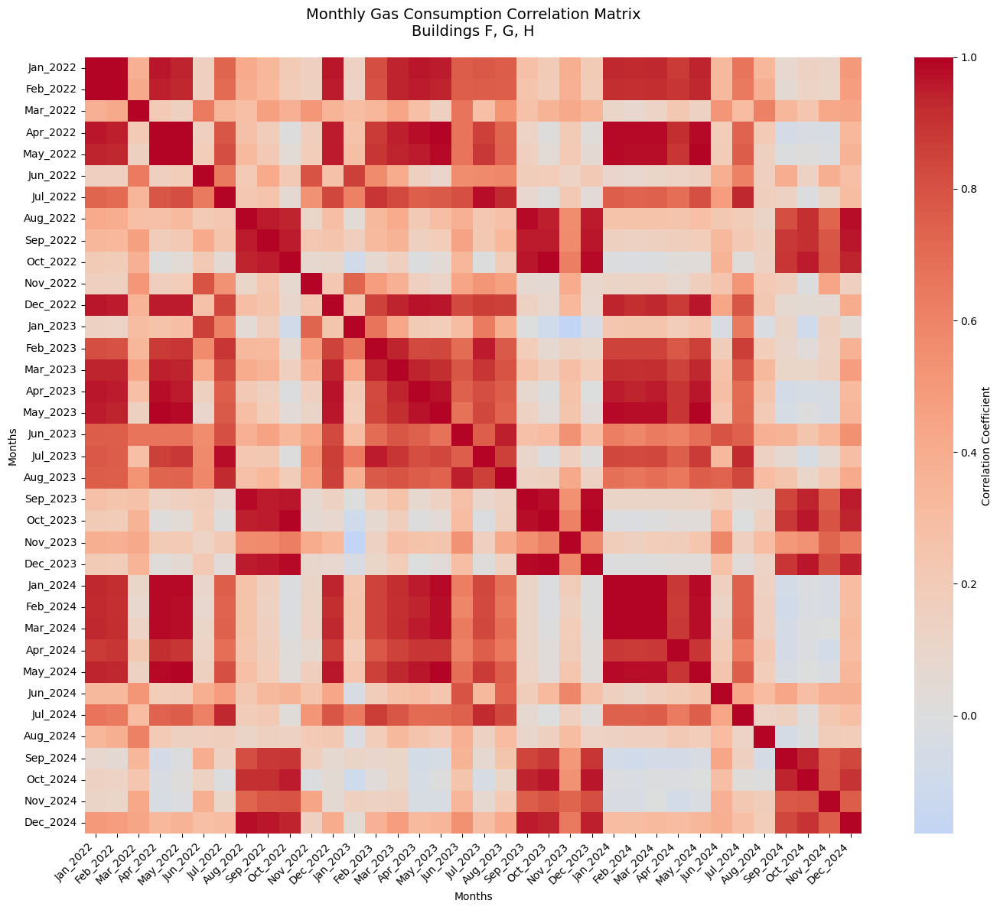

In [53]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load and prepare data
def prepare_data(file_path):
    # Read the data
    df = pd.read_csv(file_path)
    
    # Convert month columns to datetime
    month_cols = [col for col in df.columns if col != 'Meter_location']
    
    # Extract building codes
    df['Building_Code'] = df['Meter_location'].str.extract(r'([A-Z]\d{3})')
    
    # Filter for F, G, H buildings
    fgh_buildings = df[df['Building_Code'].str.startswith(('F', 'G', 'H'), na=False)]
    
    # Prepare consumption data
    consumption_data = fgh_buildings[month_cols]
    
    return consumption_data, fgh_buildings['Building_Code']

# Create correlation heatmap
def plot_correlation_heatmap(data, building_codes):
    # Calculate correlation matrix
    corr_matrix = data.corr()
    
    # Create figure with larger size
    plt.figure(figsize=(15, 12))
    
    # Create heatmap
    sns.heatmap(corr_matrix, 
                cmap='coolwarm',
                center=0,
                annot=False,  # Too many values to show annotations
                fmt='.2f',
                square=True,
                cbar_kws={'label': 'Correlation Coefficient'})
    
    # Customize the plot
    plt.title('Monthly Gas Consumption Correlation Matrix\nBuildings F, G, H', 
             pad=20, 
             size=14)
    plt.xlabel('Months')
    plt.ylabel('Months')
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    return plt

# Execute the analysis
def main():
    # Load and prepare data
    consumption_data, building_codes = prepare_data('cleaned_gas_data.csv')
    
    # Create and save the plot
    plt = plot_correlation_heatmap(consumption_data, building_codes)
    plt.savefig('gas_consumption_correlation.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Calculate and save summary statistics
    correlation_summary = consumption_data.corr().describe()
    correlation_summary.to_csv('correlation_summary_FGH.csv')

if __name__ == "__main__":
    main()


<>:11: SyntaxWarning: invalid escape sequence '\d'
<>:12: SyntaxWarning: invalid escape sequence '\d'
<>:13: SyntaxWarning: invalid escape sequence '\d'
<>:11: SyntaxWarning: invalid escape sequence '\d'
<>:12: SyntaxWarning: invalid escape sequence '\d'
<>:13: SyntaxWarning: invalid escape sequence '\d'
C:\Users\sugan\AppData\Local\Temp\ipykernel_14112\462796899.py:11: SyntaxWarning: invalid escape sequence '\d'
  f_buildings = dec_2024[df['Meter_location'].str.contains('F\d+')].sum()
C:\Users\sugan\AppData\Local\Temp\ipykernel_14112\462796899.py:12: SyntaxWarning: invalid escape sequence '\d'
  g_buildings = dec_2024[df['Meter_location'].str.contains('G\d+')].sum()
C:\Users\sugan\AppData\Local\Temp\ipykernel_14112\462796899.py:13: SyntaxWarning: invalid escape sequence '\d'
  h_buildings = dec_2024[df['Meter_location'].str.contains('H\d+')].sum()


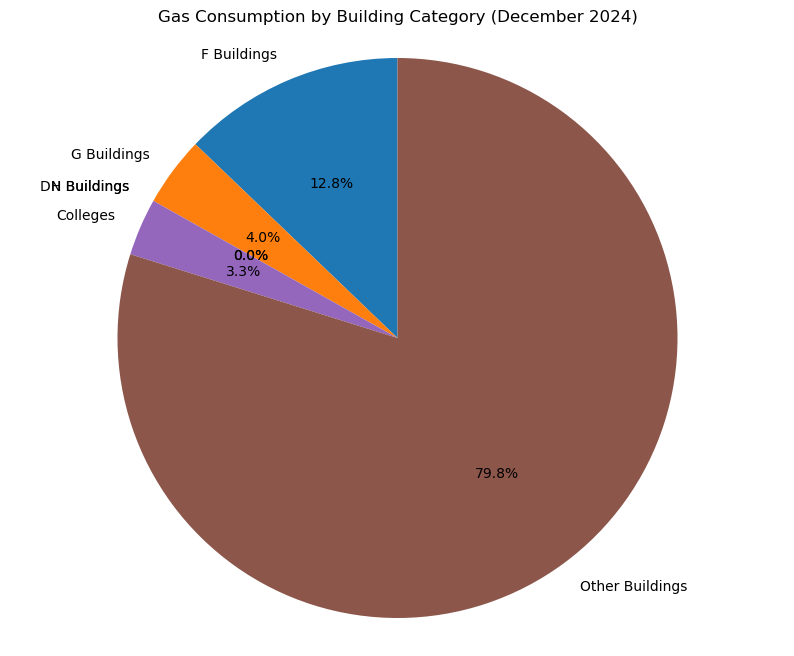

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
df = pd.read_csv('cleaned_gas_data.csv')

# Extract December 2024 data
dec_2024 = df['Dec_2024']

# Calculate sums for each category
f_buildings = dec_2024[df['Meter_location'].str.contains('F\d+')].sum()
g_buildings = dec_2024[df['Meter_location'].str.contains('G\d+')].sum()
h_buildings = dec_2024[df['Meter_location'].str.contains('H\d+')].sum()
dn_buildings = dec_2024[df['Meter_location'] == 'Total Gas Energy - DN'].sum()
colleges_buildings = dec_2024[df['Meter_location'] == 'Total Gas Energy - Colleges'].sum()

# Calculate sum for other buildings
total_sum = dec_2024.sum()
other_buildings = total_sum - (f_buildings + g_buildings + h_buildings + dn_buildings + colleges_buildings)

# Create data for pie chart
sizes = [f_buildings, g_buildings, h_buildings, dn_buildings, colleges_buildings, other_buildings]
labels = ['F Buildings', 'G Buildings', 'H Buildings', 'DN Buildings', 'Colleges', 'Other Buildings']

# Create pie chart
plt.figure(figsize=(10, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Gas Consumption by Building Category (December 2024)')
plt.show()


<>:11: SyntaxWarning: invalid escape sequence '\d'
<>:12: SyntaxWarning: invalid escape sequence '\d'
<>:13: SyntaxWarning: invalid escape sequence '\d'
<>:11: SyntaxWarning: invalid escape sequence '\d'
<>:12: SyntaxWarning: invalid escape sequence '\d'
<>:13: SyntaxWarning: invalid escape sequence '\d'
C:\Users\sugan\AppData\Local\Temp\ipykernel_14112\3222304893.py:11: SyntaxWarning: invalid escape sequence '\d'
  f_buildings = dec_2024[df['Meter_location'].str.contains('F\d+', na=False)].sum()
C:\Users\sugan\AppData\Local\Temp\ipykernel_14112\3222304893.py:12: SyntaxWarning: invalid escape sequence '\d'
  g_buildings = dec_2024[df['Meter_location'].str.contains('G\d+', na=False)].sum()
C:\Users\sugan\AppData\Local\Temp\ipykernel_14112\3222304893.py:13: SyntaxWarning: invalid escape sequence '\d'
  h_buildings = dec_2024[df['Meter_location'].str.contains('H\d+', na=False)].sum()


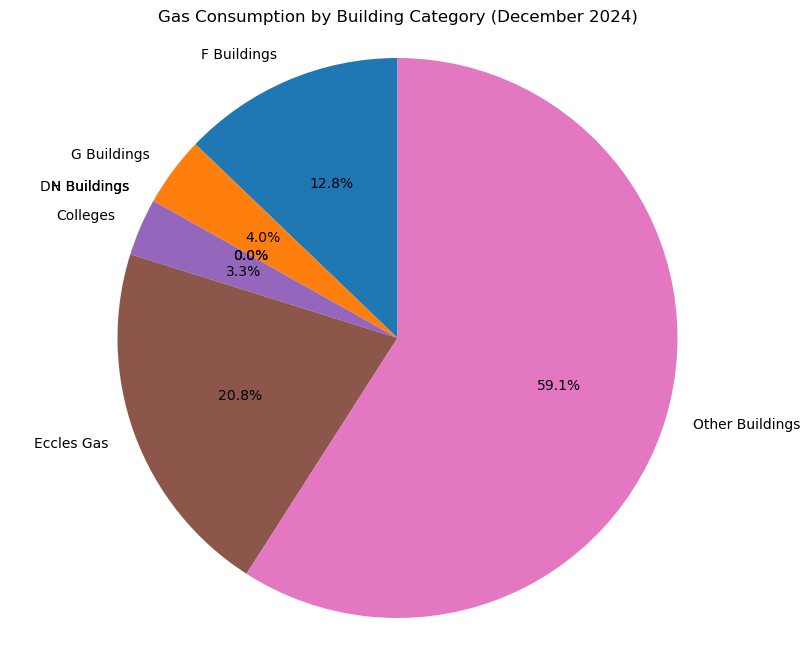

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
df = pd.read_csv('cleaned_gas_data.csv')

# Extract December 2024 data (most recent complete month)
dec_2024 = df['Dec_2024']

# Calculate sums for each category
f_buildings = dec_2024[df['Meter_location'].str.contains('F\d+', na=False)].sum()
g_buildings = dec_2024[df['Meter_location'].str.contains('G\d+', na=False)].sum()
h_buildings = dec_2024[df['Meter_location'].str.contains('H\d+', na=False)].sum()
dn_buildings = dec_2024[df['Meter_location'] == 'Total Gas Energy - DN'].sum()
colleges_buildings = dec_2024[df['Meter_location'] == 'Total Gas Energy - Colleges'].sum()
eccles_gas = dec_2024[df['Meter_location'] == 'E325 Eccles Gas meter'].sum()

# Calculate sum for other buildings
total_sum = dec_2024.sum()
other_buildings = total_sum - (f_buildings + g_buildings + h_buildings + dn_buildings + colleges_buildings + eccles_gas)

# Create data for pie chart
sizes = [f_buildings, g_buildings, h_buildings, dn_buildings, colleges_buildings, eccles_gas, other_buildings]
labels = ['F Buildings', 'G Buildings', 'H Buildings', 'DN Buildings', 'Colleges', 'Eccles Gas', 'Other Buildings']

# Create pie chart
plt.figure(figsize=(10, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Gas Consumption by Building Category (December 2024)')
plt.show()


C:\Users\sugan\AppData\Local\Temp\ipykernel_15620\1098312873.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
C:\Users\sugan\AppData\Local\Temp\ipykernel_15620\1098312873.py:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')


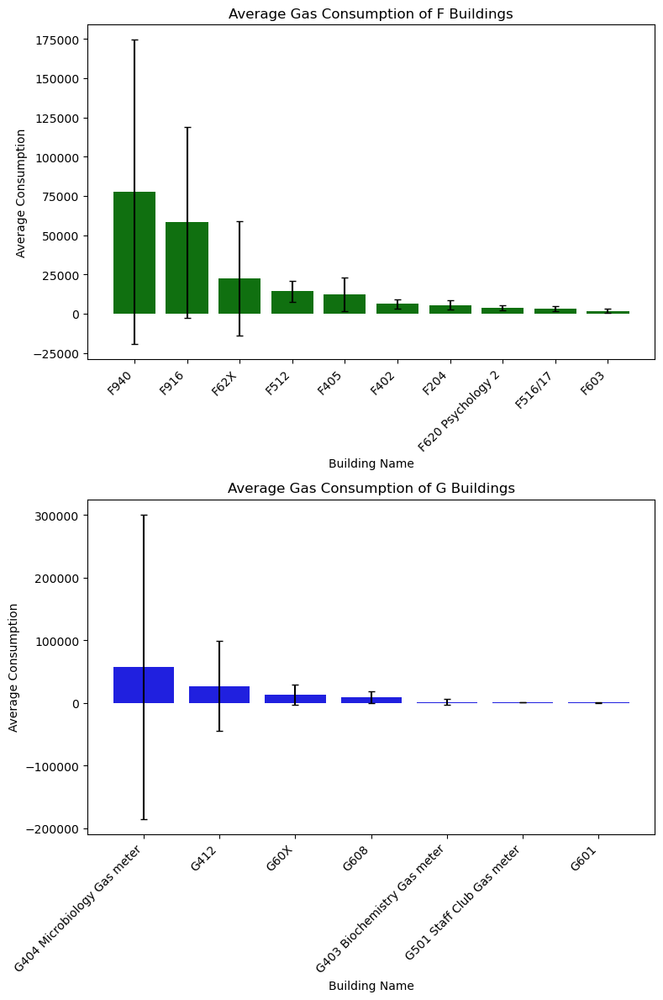

F Buildings Statistics:
  Building_Code      Building_Name          mean           std
9             F               F940  77483.012222  96851.332506
8             F               F916  58143.677778  60611.277870
7             F               F62X  22420.620556  36627.764331
3             F               F512  14249.307222   6810.631495
2             F               F405  12413.981111  10669.105007
1             F               F402   6165.855833   3114.341329
0             F               F204   5496.937778   3017.237176
6             F  F620 Psychology 2   3779.152500   1572.226958
4             F            F516/17   3257.030833   1520.297373
5             F               F603   1788.469444   1337.894555

G Buildings Statistics:
   Building_Code                Building_Name          mean            std
11             G  G404 Microbiology Gas meter  57979.131667  242707.989289
12             G                         G412  26939.810556   71675.793167
16             G                 

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the CSV file
df = pd.read_csv('imputed_modelling_gas_data.csv')

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Extract building code and name from Meter_Location
df_melted['Building_Code'] = df_melted['Meter_Location'].str[0]
df_melted['Building_Name'] = df_melted['Meter_Location'].str.split(',').str[0]

# Calculate mean and standard deviation for each building
df_stats = df_melted.groupby(['Building_Code', 'Building_Name'])['Consumption'].agg(['mean', 'std']).reset_index()

# Separate F and G buildings
df_f = df_stats[df_stats['Building_Code'] == 'F'].sort_values('mean', ascending=False)
df_g = df_stats[df_stats['Building_Code'] == 'G'].sort_values('mean', ascending=False)

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 12))

# Plot F buildings
sns.barplot(x='Building_Name', y='mean', data=df_f, ax=ax1, color='green', capsize=0.25)
ax1.errorbar(x=range(len(df_f)), y=df_f['mean'], yerr=df_f['std'], fmt='none', capsize=3, color='black')
ax1.set_title('Average Gas Consumption of F Buildings')
ax1.set_xlabel('Building Name')
ax1.set_ylabel('Average Consumption')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')

# Plot G buildings
sns.barplot(x='Building_Name', y='mean', data=df_g, ax=ax2, color='blue', capsize=0.25)
ax2.errorbar(x=range(len(df_g)), y=df_g['mean'], yerr=df_g['std'], fmt='none', capsize=3, color='black')
ax2.set_title('Average Gas Consumption of G Buildings')
ax2.set_xlabel('Building Name')
ax2.set_ylabel('Average Consumption')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

# Print statistics
print("F Buildings Statistics:")
print(df_f)
print("\nG Buildings Statistics:")
print(df_g)


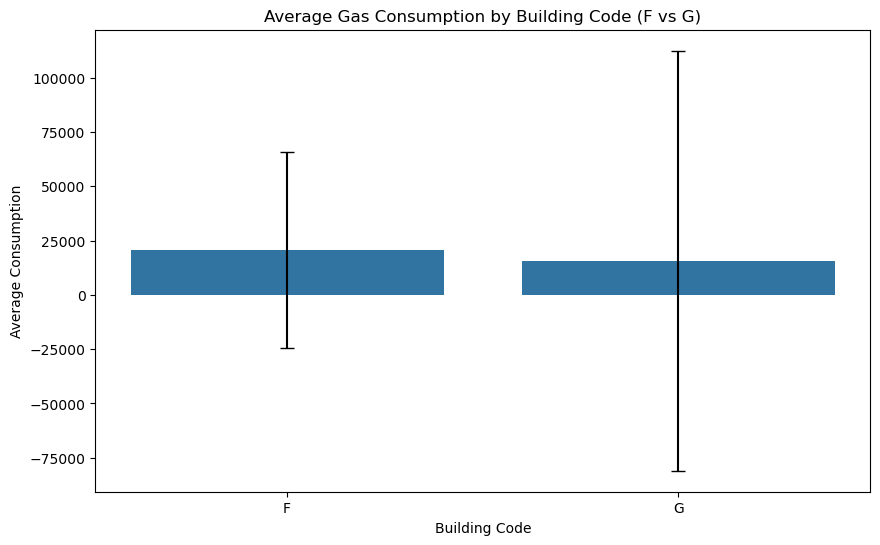

  Building_Code          mean           std
0             F  20519.804528  45124.783512
1             G  15731.244722  96726.792757


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the CSV file
df = pd.read_csv('imputed_modelling_gas_data.csv')

# Melt the dataframe to long format
df_melted = df.melt(id_vars=['Meter_Location'], var_name='Month', value_name='Consumption')

# Extract building code from Meter_Location
df_melted['Building_Code'] = df_melted['Meter_Location'].str[0]

# Filter for F and G buildings
df_fg = df_melted[df_melted['Building_Code'].isin(['F', 'G'])]

# Calculate mean and standard deviation for each building
df_stats = df_fg.groupby('Building_Code')['Consumption'].agg(['mean', 'std']).reset_index()

# Create the bar plot with error bars
plt.figure(figsize=(10, 6))
sns.barplot(x='Building_Code', y='mean', data=df_stats, capsize=0.1)
plt.errorbar(x=df_stats['Building_Code'], y=df_stats['mean'], yerr=df_stats['std'], fmt='none', capsize=5, color='black')

plt.title('Average Gas Consumption by Building Code (F vs G)')
plt.xlabel('Building Code')
plt.ylabel('Average Consumption')
plt.show()

# Print statistics
print(df_stats)


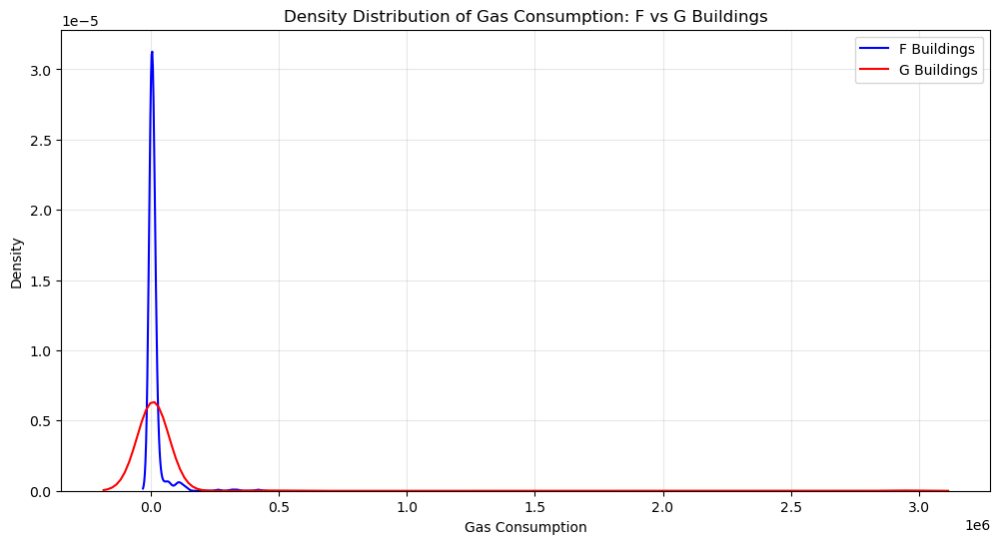

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Read the data
df = pd.read_csv('cleaned_gas_data.csv')

# Melt the dataframe
df_melted = pd.melt(df, id_vars=['Meter_location'], var_name='Date', value_name='Consumption')

# Create building code column
df_melted['Building_Code'] = df_melted['Meter_location'].str.extract(r'([A-Z]\d{3})')

# Filter for F and G buildings
f_buildings = df_melted[df_melted['Building_Code'].str.startswith('F', na=False)]
g_buildings = df_melted[df_melted['Building_Code'].str.startswith('G', na=False)]

# Create the density plot
plt.figure(figsize=(12, 6))
sns.kdeplot(data=f_buildings['Consumption'], label='F Buildings', color='blue')
sns.kdeplot(data=g_buildings['Consumption'], label='G Buildings', color='red')

plt.title('Density Distribution of Gas Consumption: F vs G Buildings')
plt.xlabel('Gas Consumption')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)

plt.show()


In [21]:
import pandas as pd
import numpy as np

def detect_sigma_outliers(data, sigma_threshold=2):
    mean = np.mean(data)
    std = np.std(data)
    
    # Define bounds
    upper_bound = mean + (sigma_threshold * std)
    lower_bound = mean - (sigma_threshold * std)
    
    # Find outliers
    outliers = data[(data > upper_bound) | (data < lower_bound)]
    
    return outliers, lower_bound, upper_bound

# For F Buildings
f_buildings_consumption = f_buildings['Consumption']
f_outliers_2sigma, f_lower_2sigma, f_upper_2sigma = detect_sigma_outliers(f_buildings_consumption, 2)
f_outliers_3sigma, f_lower_3sigma, f_upper_3sigma = detect_sigma_outliers(f_buildings_consumption, 3)

print("F Buildings:")
print(f"2-sigma bounds: {f_lower_2sigma:.2f} to {f_upper_2sigma:.2f}")
print(f"3-sigma bounds: {f_lower_3sigma:.2f} to {f_upper_3sigma:.2f}")
print(f"Number of outliers (2-sigma): {len(f_outliers_2sigma)}")
print(f"Number of outliers (3-sigma): {len(f_outliers_3sigma)}")


F Buildings:
2-sigma bounds: -58421.13 to 84532.19
3-sigma bounds: -94159.46 to 120270.52
Number of outliers (2-sigma): 18
Number of outliers (3-sigma): 8


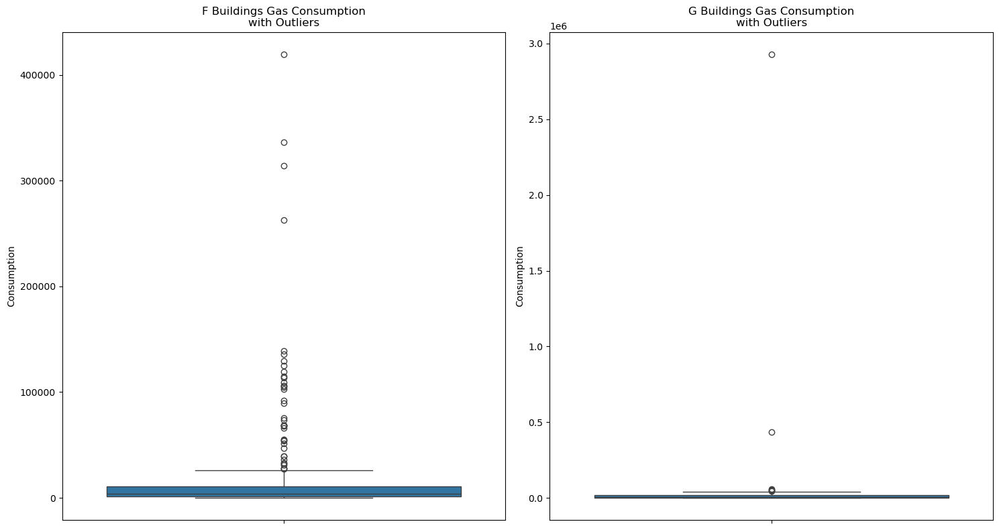

Notable Outliers in F Buildings:
                                 Meter_location      Date  Consumption
23   F916,COLLEGE OF EDUCATION BOILER HOUSE,151  Jan_2022     39249.13
66   F916,COLLEGE OF EDUCATION BOILER HOUSE,151  Feb_2022     39249.13
152  F916,COLLEGE OF EDUCATION BOILER HOUSE,151  Apr_2022     89489.38
195  F916,COLLEGE OF EDUCATION BOILER HOUSE,151  May_2022    119036.48
275    F405,SMITHELL'S GYMNASIUM,690 CUMBERLAND  Jul_2022     33051.58

Notable Outliers in G Buildings:
                                  Meter_location      Date  Consumption
248   G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE  Jun_2022     55845.98
291   G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE  Jul_2022     46017.08
549   G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE  Jan_2023    434059.75
807   G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE  Jul_2023     53925.00
1323  G412,SCIENCE 2 BOILER HOUSE,72 UNION PLACE  Jul_2024     49971.04


In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Read and prepare data
df = pd.read_csv('cleaned_gas_data.csv')
df_melted = pd.melt(df, id_vars=['Meter_location'], var_name='Date', value_name='Consumption')

# Create building code column
df_melted['Building_Code'] = df_melted['Meter_location'].str.extract(r'([A-Z]\d{3})')

# Separate F and G buildings
f_buildings = df_melted[df_melted['Building_Code'].str.startswith('F', na=False)]
g_buildings = df_melted[df_melted['Building_Code'].str.startswith('G', na=False)]

# Calculate outlier bounds using IQR method
def get_outlier_bounds(data):
    Q1 = np.percentile(data['Consumption'], 25)
    Q3 = np.percentile(data['Consumption'], 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

f_lower, f_upper = get_outlier_bounds(f_buildings)
g_lower, g_upper = get_outlier_bounds(g_buildings)

# Create plot
plt.figure(figsize=(15, 8))

# Plot F buildings
plt.subplot(1, 2, 1)
sns.boxplot(y=f_buildings['Consumption'])
plt.title('F Buildings Gas Consumption\nwith Outliers')
plt.ylabel('Consumption')

# Plot G buildings
plt.subplot(1, 2, 2)
sns.boxplot(y=g_buildings['Consumption'])
plt.title('G Buildings Gas Consumption\nwith Outliers')
plt.ylabel('Consumption')

plt.tight_layout()
plt.show()

# Print significant outliers
print("Notable Outliers in F Buildings:")
f_outliers = f_buildings[f_buildings['Consumption'] > f_upper]
print(f_outliers[['Meter_location', 'Date', 'Consumption']].head())

print("\nNotable Outliers in G Buildings:")
g_outliers = g_buildings[g_buildings['Consumption'] > g_upper]
print(g_outliers[['Meter_location', 'Date', 'Consumption']].head())
